# Data-driven Time-Dependent Biogas Model of the Anaerobic Digester

## Preamble

In [111]:
# Here all the required packages are loaded
import numpy as np
import os
import pandas as pd
from pymatreader import read_mat
from copy import deepcopy
from sklearn.model_selection import train_test_split
from matplotlib.lines import Line2D
import plotly.figure_factory as ff
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from scipy.stats import norm
from sklearn.cross_decomposition import PLSRegression
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import dill
from sklearn.model_selection import PredefinedSplit
from sklearn.svm import SVR
from hypopt import GridSearch
import seaborn as sns
from sklearn.linear_model import Ridge
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import tree
from scipy import stats
from ipywidgets import widgets, interactive, interact

## Loading and preparation of the data

First we load the data from a local directory.

The data is available from my Google drive at:
https://drive.google.com/file/d/183sbF1tTeYw0HyxDqr-7paquMeNOuLp2/view?usp=sharing

In [2]:
# Redirect to the directory where the file is located
directory = '/Users/Sebastian/Documents/Leif/DTU/Speciale/Runs'
os.chdir(directory)

# Load the file with the pymatreader function read_mat
data_mat = read_mat('Data.mat')

Second we need to create dataframes with the proper labeling where we can load the different data-sets. The data file includes matrices for both the effluent and biogas modelling, however for this notebook we will focus on the biogas modelling.

In [3]:
# Defining column names
# Variable names for the first biogas model that takes its input from the influent
# to the anaerobic digester
Header_X_in = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$', r'$\mathbf{CH_3COO^-}$','pH']

# Variable names for the second biogas model that takes its input from the effluent
# of the anaerobic digester
Header_X_out = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$','pH', 'VFAs']

# Variable names for the outputs of the biogas model. The variables that we are trying to predict.
Header_y  = ['Biogas', r'$\mathbf{CH_{4}}$ fraction']

In [4]:
# The following function is used to standardize the data, so it has mean 0 and variance 1
scaler = StandardScaler()

# Creating a Pandas dataframe for the 3 data sets.
X_in = pd.DataFrame(scaler.fit_transform(data_mat['Digester_in_X']), columns = Header_X_in)
X_out = pd.DataFrame(scaler.fit_transform(data_mat['Digester_out_X']), columns = Header_X_out)
y = pd.DataFrame(data_mat['Digester_out_y'], columns = Header_y)
yscale = pd.DataFrame(scaler.fit_transform(data_mat['Digester_out_y']), columns = Header_y)

In [5]:
def mean_and_variance(X):
    split = int(len(X)/4)
    X1, X2, X3, X4 = X[0:split], X[split:split*2], X[split*2:split*3], X[split*3:]
    mean = pd.DataFrame([X1.mean(), X2.mean(), X3.mean(), X4.mean()])
    var = pd.DataFrame([X1.var(), X2.var(), X3.var(), X4.var()])
    
    return mean, var
    

In [6]:
#This function plots 4 consecutive means, variances and a histogram of the data

def mvh(X,title,graphsize):
    mean, var = mean_and_variance(X)
    number_of_variables = X.shape[1]
    plot_names = ['Means', 'Variances', 'Histogram']
    
    fig, ax = plt.subplots(number_of_variables, 3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 20, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    
    for i in range(number_of_variables):
        ax[i,0].scatter([1,2,3,4], mean[X.columns.tolist()[i]])
        ax[i,1].scatter([1,2,3,4], var[X.columns.tolist()[i]])
        ax[i,2].hist(X[X.columns.tolist()[i]], bins = 100)
        ax[i,0].set_ylim(-1,1)
        ax[i,0].axhline(y=0, color='r', linestyle = '-')
        ax[i,1].set_ylim(-1+np.mean(var[X.columns.tolist()[i]]),np.mean(var[X.columns.tolist()[i]])+1)
        ax[i,1].axhline(y=np.mean(var[X.columns.tolist()[i]]), color='r', linestyle = '-')
        
        
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            

In [7]:
# The following function plots the first daily, weekly, monthly 
#and yearly data for the variables in a dataset
def dwmy(X,title,graphsize):
    
    
    number_of_variables = X.shape[1]
    fig, ax = plt.subplots(number_of_variables, 4, figsize = (20, graphsize))
    times_words = ['Daily','Weekly','Monthly','Yearly']
    
    fig.suptitle(title, fontsize = 20, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    
    for j in range(4):
        for i in range(number_of_variables):
            times = [4*24, 4*24*7, 4*24*30, 4*24*364]
            ax[i,j].plot(X[X.columns.tolist()[i]][:times[j]])
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
        ax[0,j].set_title(times_words[j], fontweight = 'bold', fontsize = 15)

In [8]:
# The following function plots the ACF and PACF for the different variables

def ACFPACF(X, title, graphsize):
    
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],2, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['ACF', 'PCAF']

    for i in range(number_of_variables):
        plot_acf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_pacf(X[X.columns.tolist()[i]], ax = ax[i,1], title = None)
    
    for i in range(number_of_variables):
        for j in range(2):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)

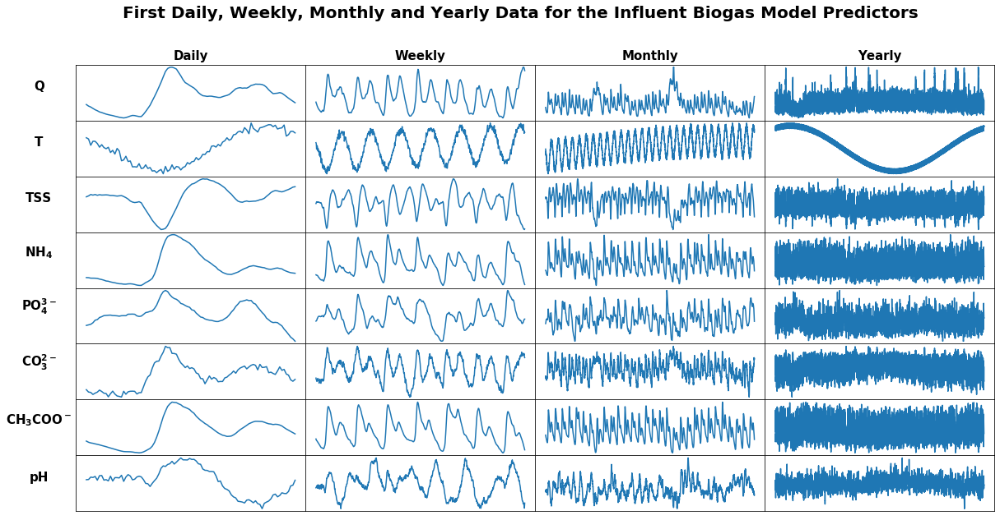

In [14]:
dwmy(X_in, 'First Daily, Weekly, Monthly and Yearly Data for the Influent Biogas Model Predictors', 10)

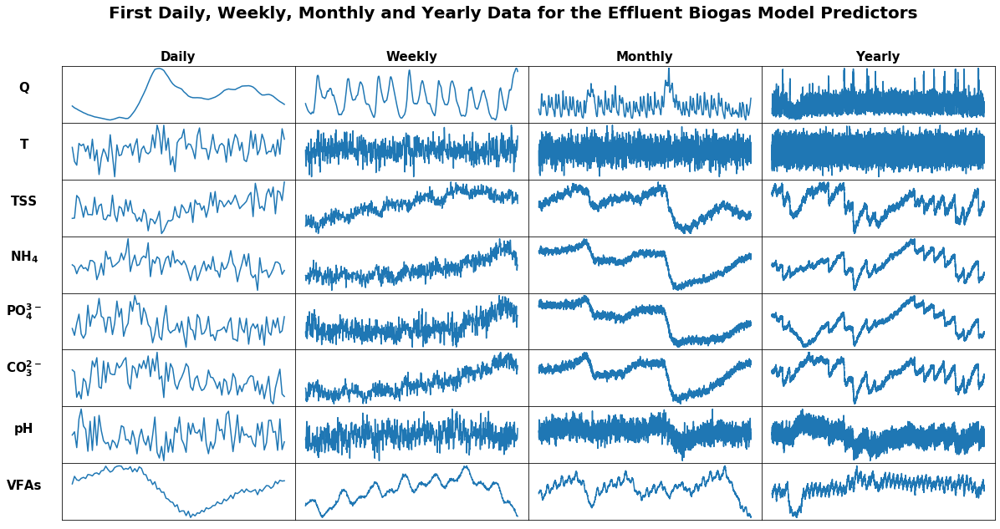

In [16]:
dwmy(X_out,'First Daily, Weekly, Monthly and Yearly Data for the Effluent Biogas Model Predictors',10)

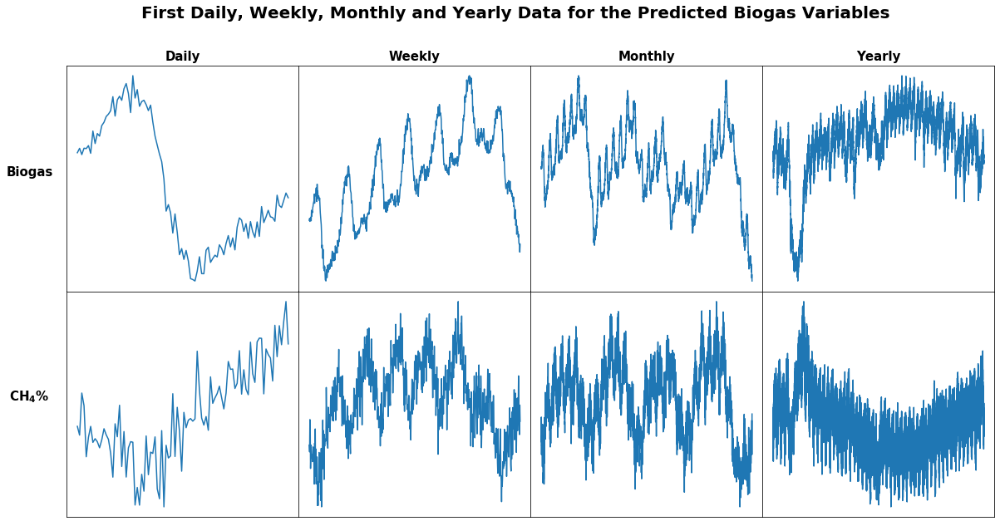

In [17]:
dwmy(yscale,'First Daily, Weekly, Monthly and Yearly Data for the Predicted Biogas Variables',10 )

For time series modelling it is important for the data to be stationary otherwise the autocorrelation does not dominate other correlation structures. First we can check for non-stationarity

In [8]:
def mean_and_variance(X):
    split = int(len(X)/4)
    X1, X2, X3, X4 = X[0:split], X[split:split*2], X[split*2:split*3], X[split*3:]
    mean = pd.DataFrame([X1.mean(), X2.mean(), X3.mean(), X4.mean()])
    var = pd.DataFrame([X1.var(), X2.var(), X3.var(), X4.var()])
    
    return mean, var
    

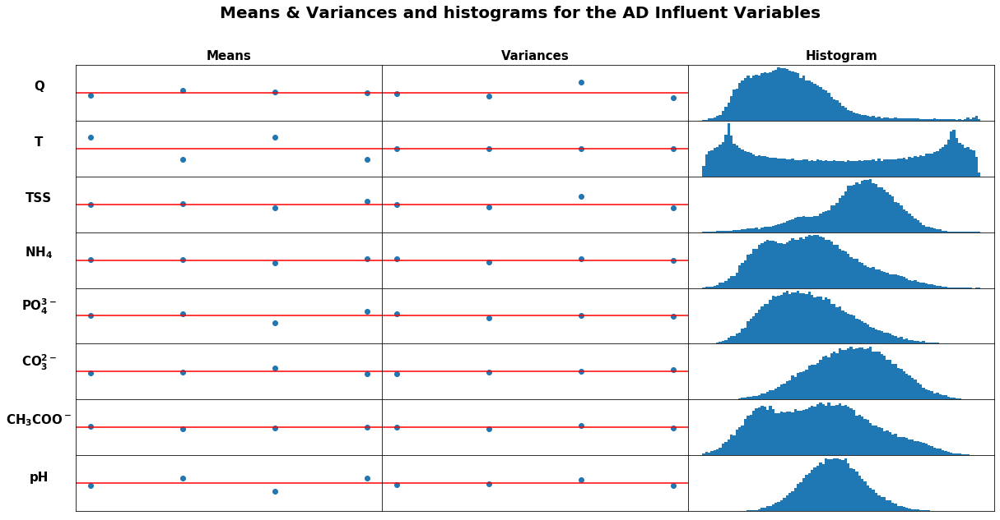

In [18]:
mvh(X_in,'Means & Variances and histograms for the AD Influent Variables',10)

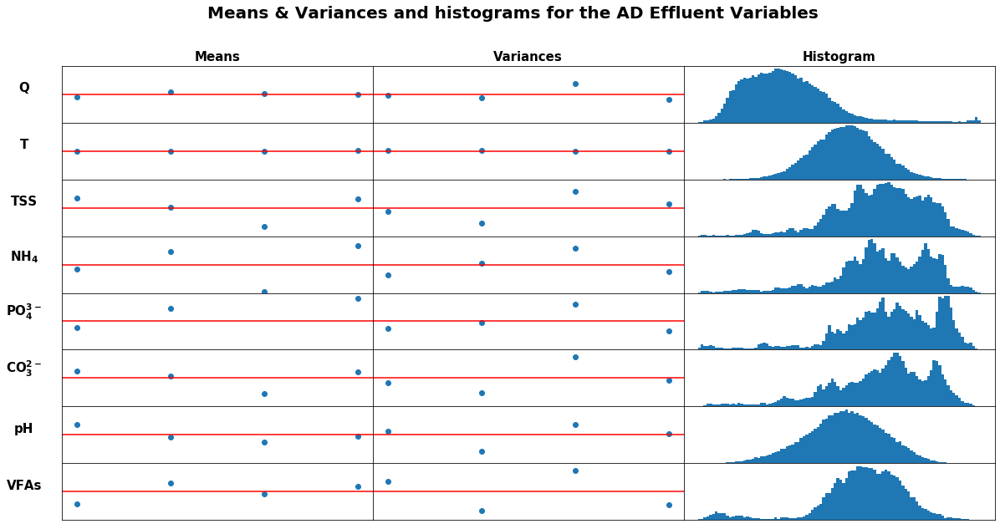

In [19]:
mvh(X_out,'Means & Variances and histograms for the AD Effluent Variables',10)

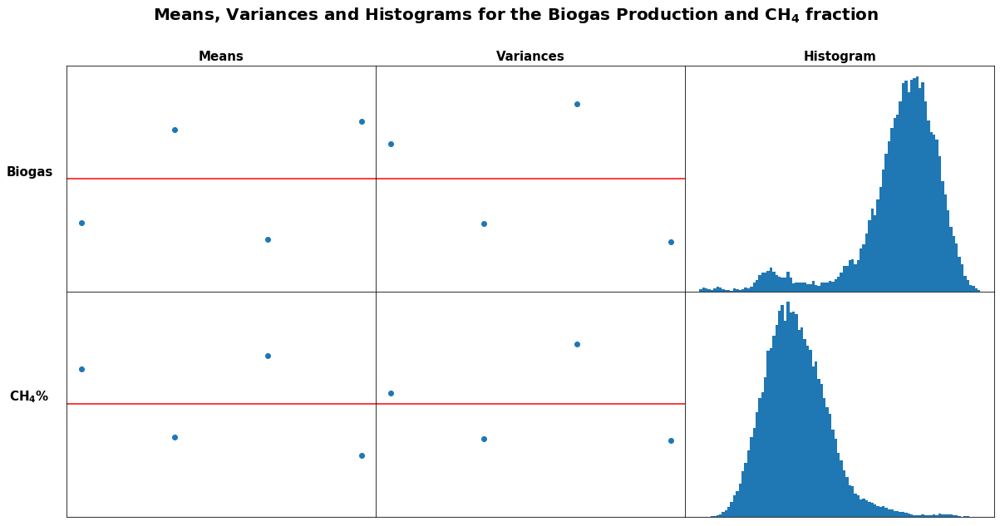

In [36]:
mvh(yscale, r'Means, Variances and Histograms for the Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

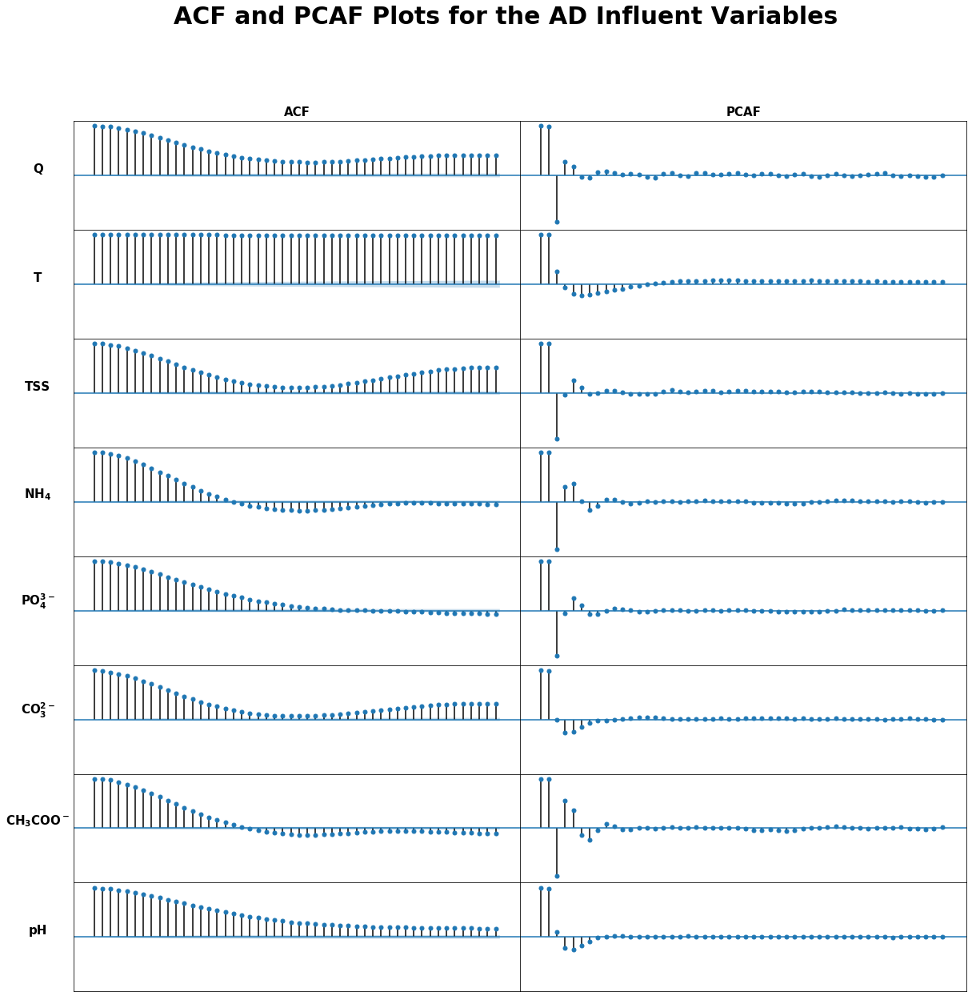

In [27]:
ACFPACF(X_in,'ACF and PCAF Plots for the AD Influent Variables',20)

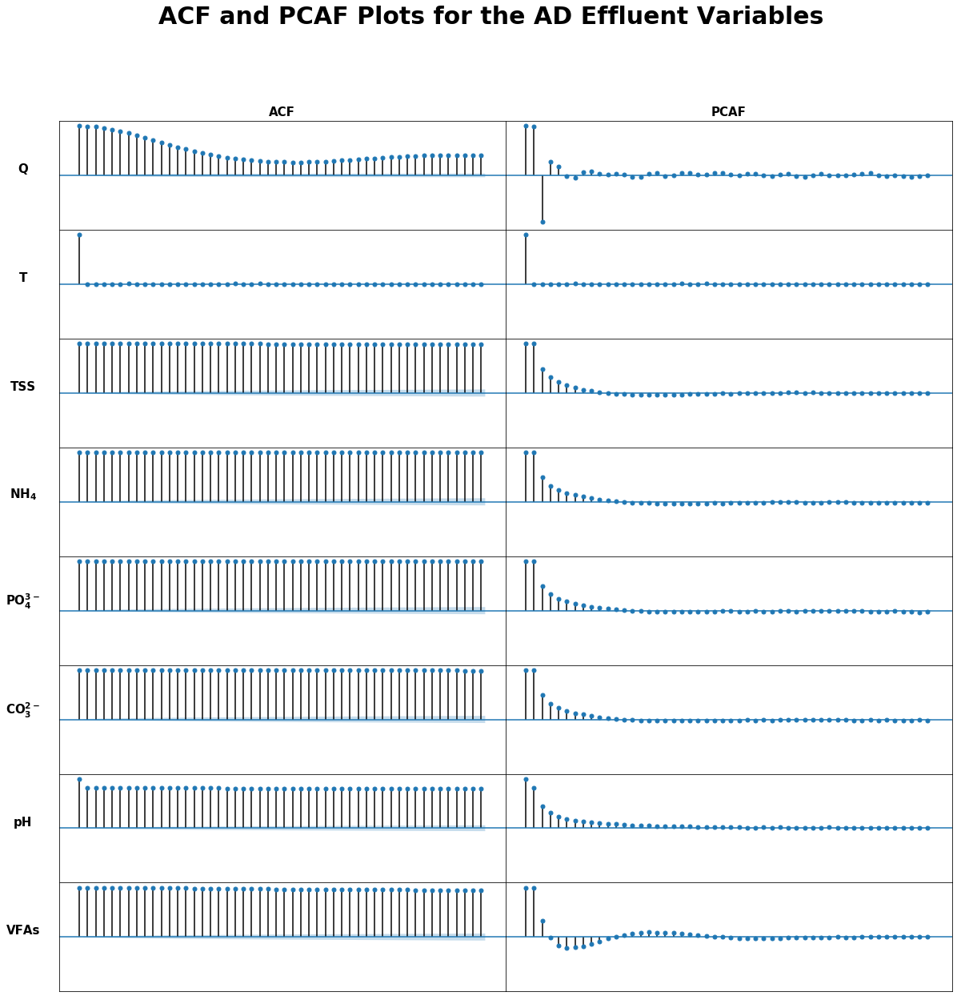

In [28]:
ACFPACF(X_out,'ACF and PCAF Plots for the AD Effluent Variables',20)

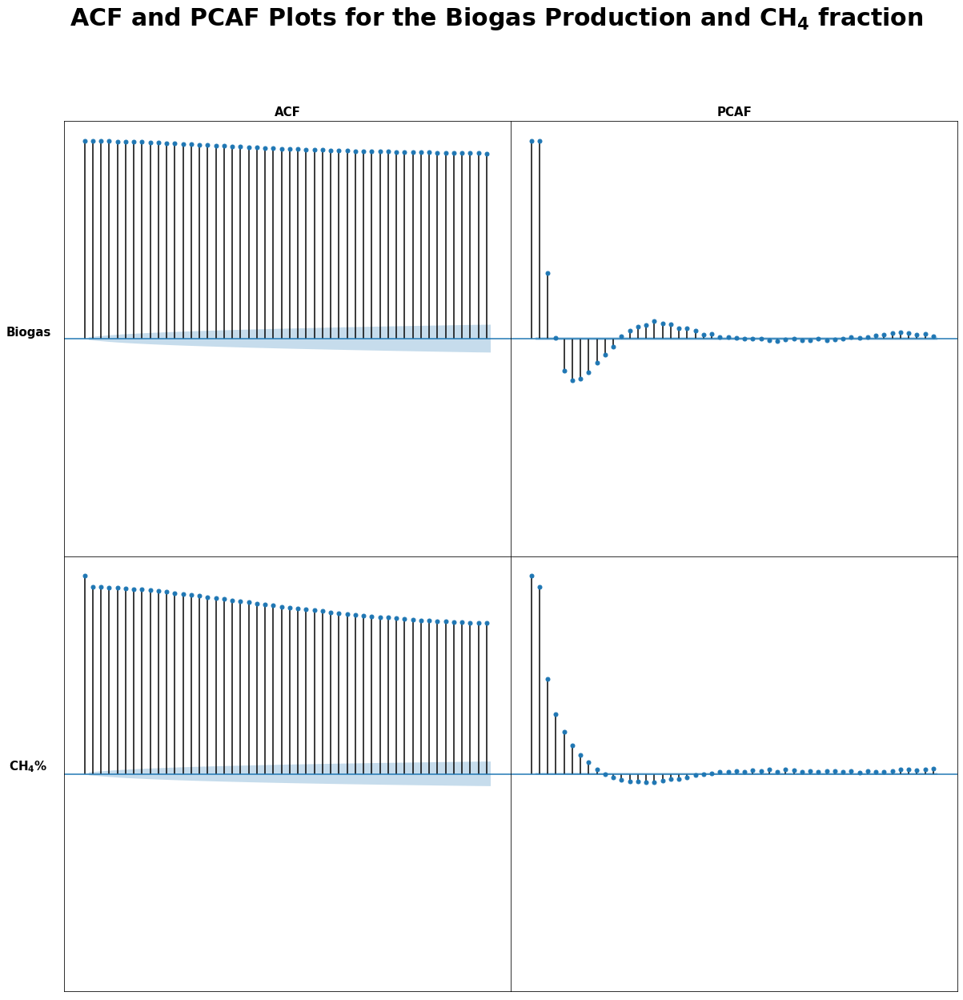

In [35]:
ACFPACF(yscale,r'ACF and PCAF Plots for the Biogas Production and $\mathbf{CH_{4}}$ fraction',20)

## Most of the variables have different means and variances across different periods of the two years, indicating that the data is not stationary. In an attempt to remedy this I will try to difference the data. There is a very evident daily pattern as seen from the plots of the weekly data. Therefor a daily differencing seems appropriate

In [9]:
X_in_daily_diff = X_in.diff(96).dropna()
X_out_daily_diff = X_out.diff(96).dropna()
y_daily_diff = yscale.diff(96).dropna()

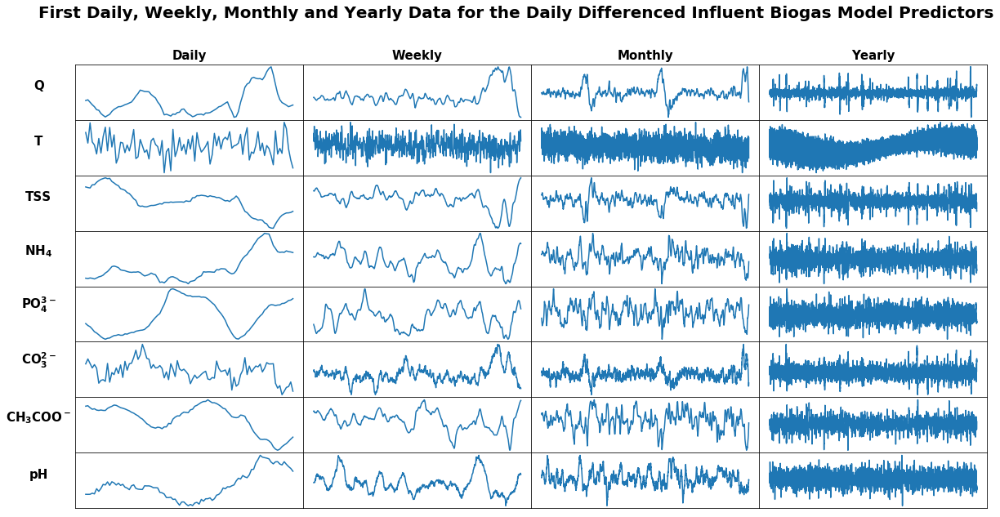

In [41]:
dwmy(X_in_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Influent Biogas Model Predictors', 10)

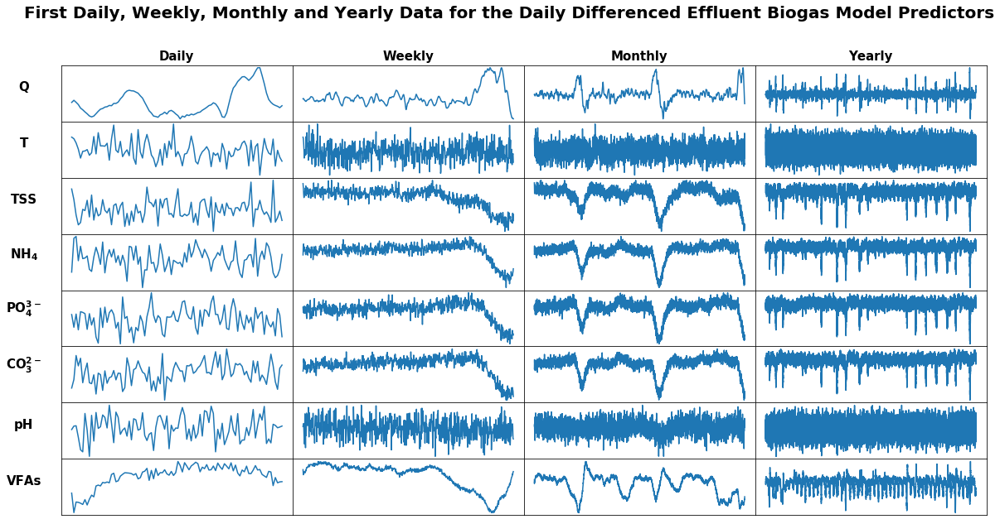

In [42]:
dwmy(X_out_daily_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Effluent Biogas Model Predictors', 10)

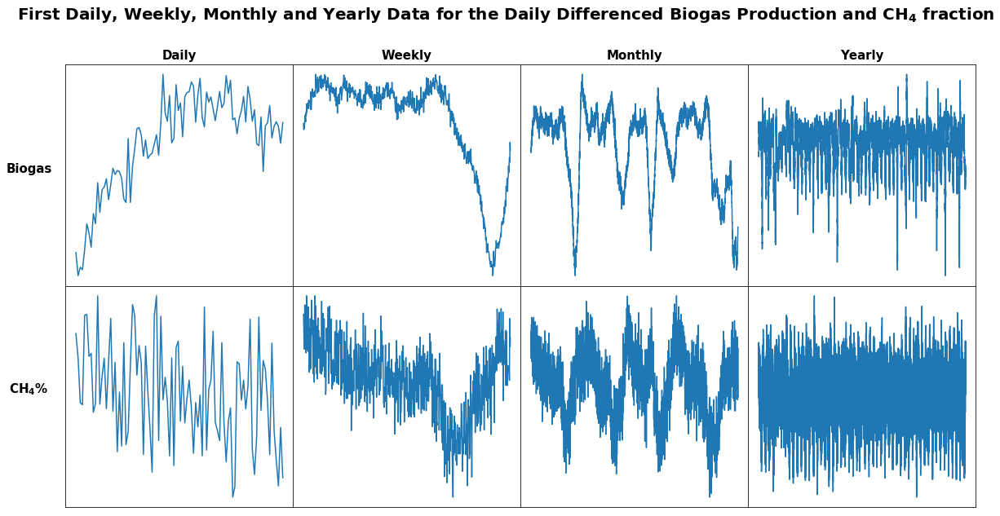

In [43]:
dwmy(y_daily_diff, r'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

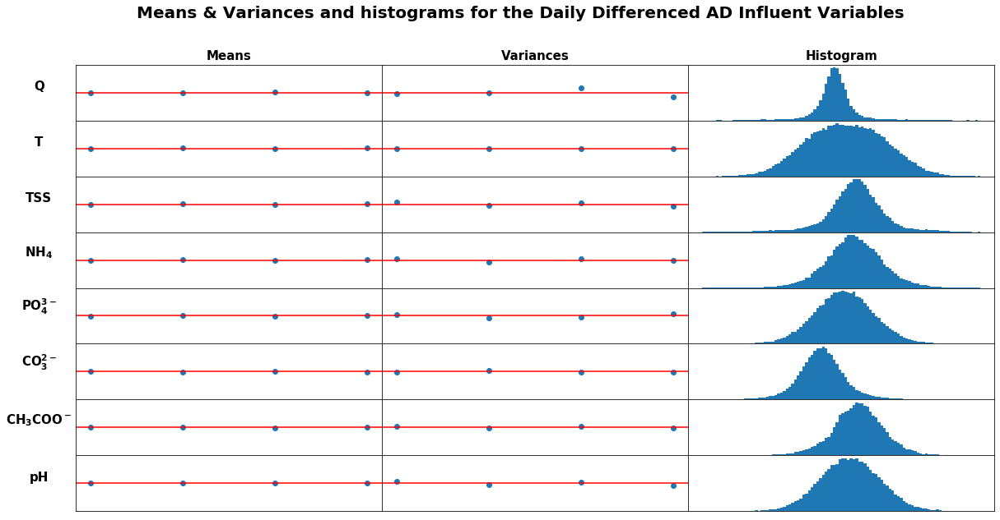

In [44]:
mvh(X_in_daily_diff,'Means & Variances and histograms for the Daily Differenced AD Influent Variables',10)

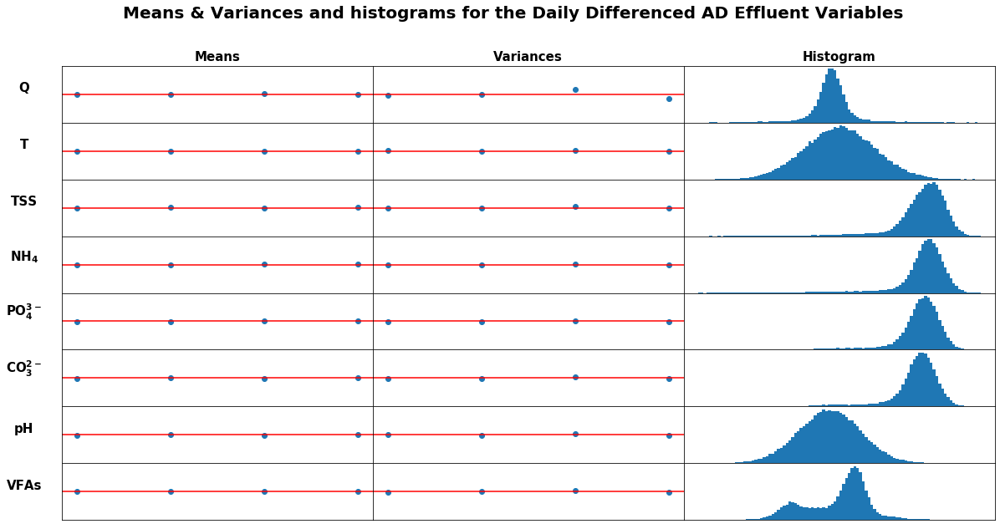

In [45]:
mvh(X_out_daily_diff,'Means & Variances and histograms for the Daily Differenced AD Effluent Variables',10)

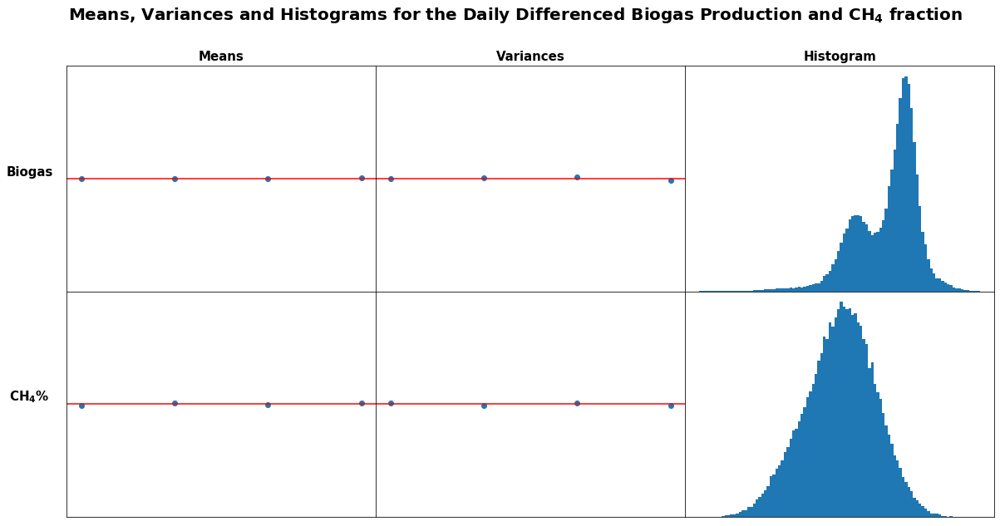

In [46]:
mvh(y_daily_diff,r'Means, Variances and Histograms for the Daily Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction', 10 )

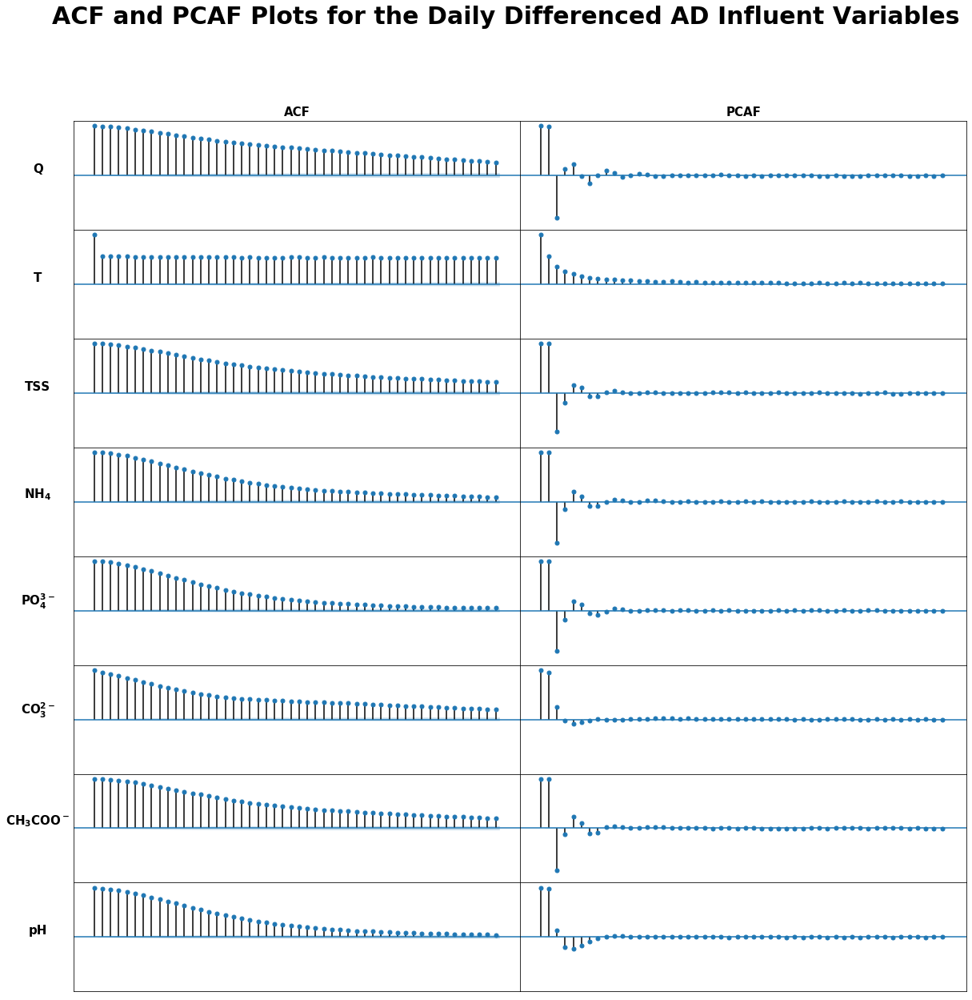

In [48]:
ACFPACF(X_in_daily_diff, 'ACF and PCAF Plots for the Daily Differenced AD Influent Variables',20)

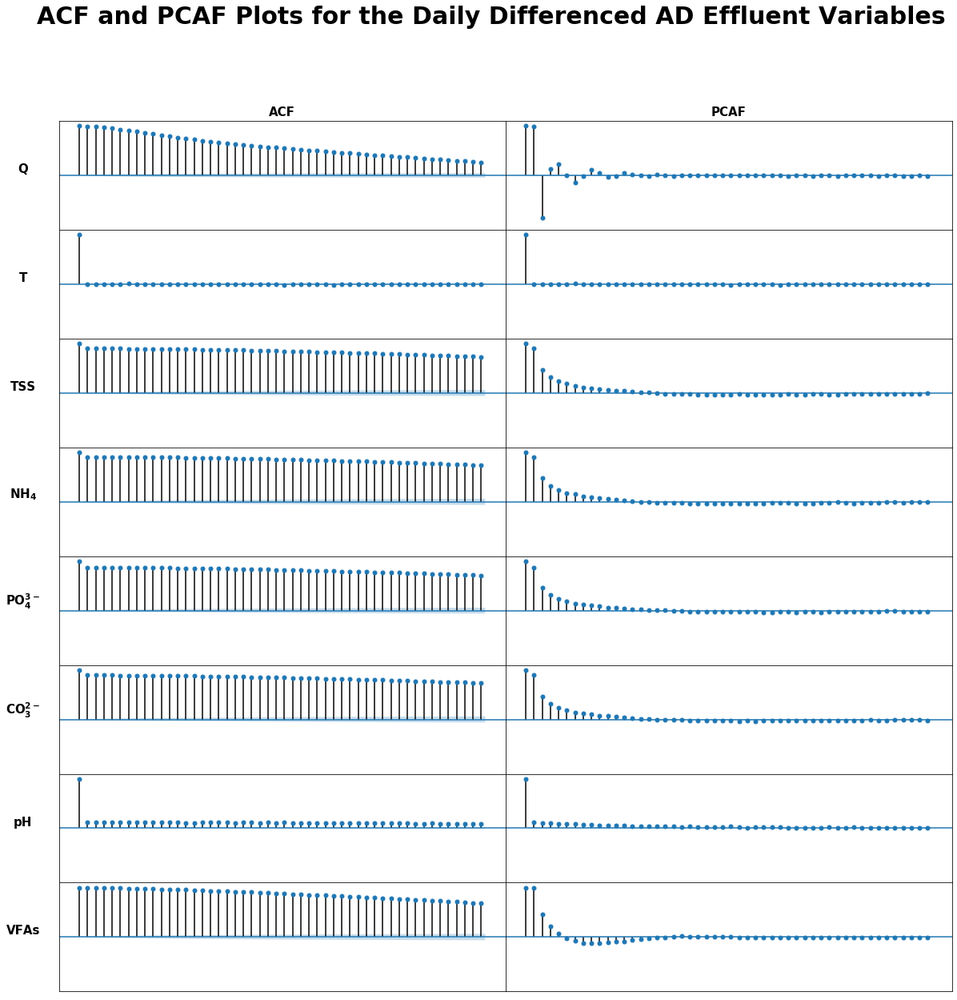

In [49]:
ACFPACF(X_out_daily_diff, 'ACF and PCAF Plots for the Daily Differenced AD Effluent Variables',20)

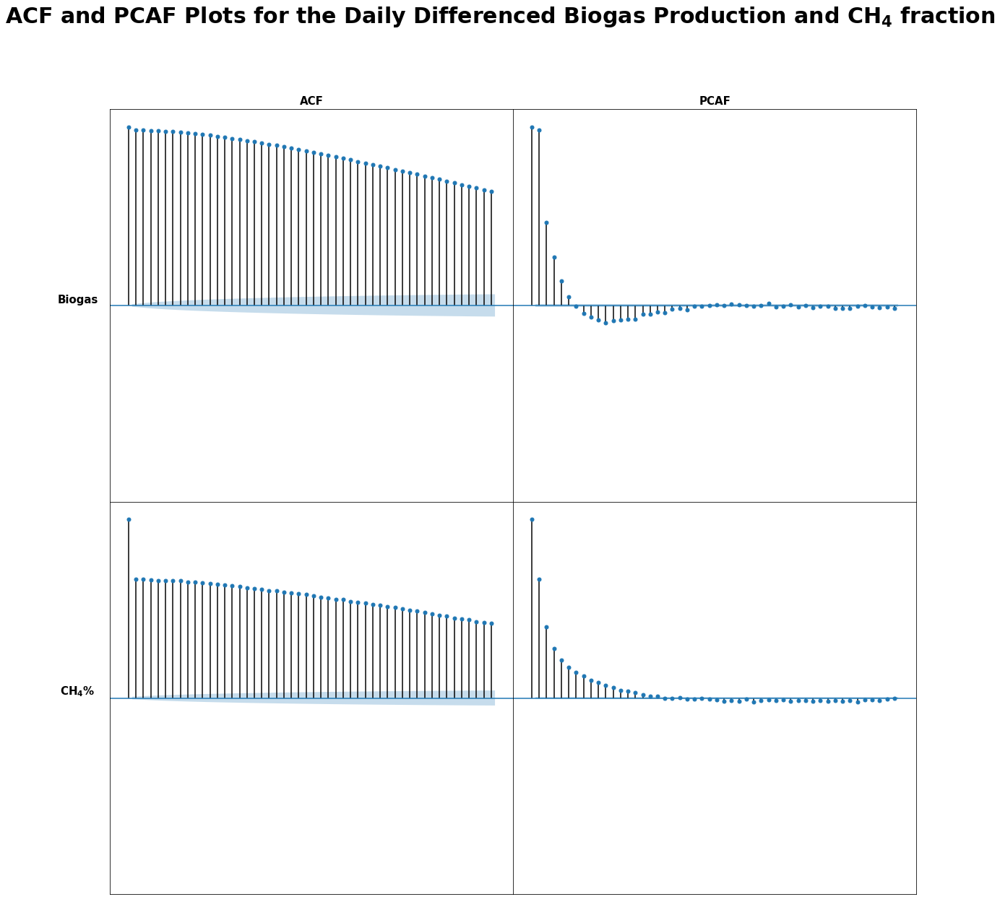

In [50]:
ACFPACF(y_daily_diff, r'ACF and PCAF Plots for the Daily Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction',20)

## The means and variances are now stationary, however let us try to add on a 15 minute difference (one measurement)

In [10]:
X_in_diff = X_in_daily_diff.diff().dropna()
X_out_diff = X_out_daily_diff.diff().dropna()
y_diff = y_daily_diff.diff().dropna()

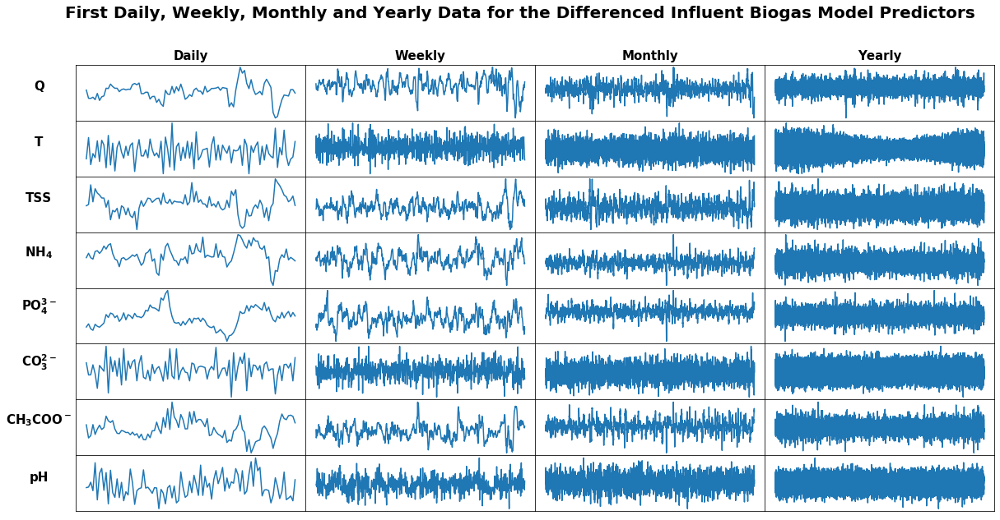

In [52]:
dwmy(X_in_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Influent Biogas Model Predictors',10)

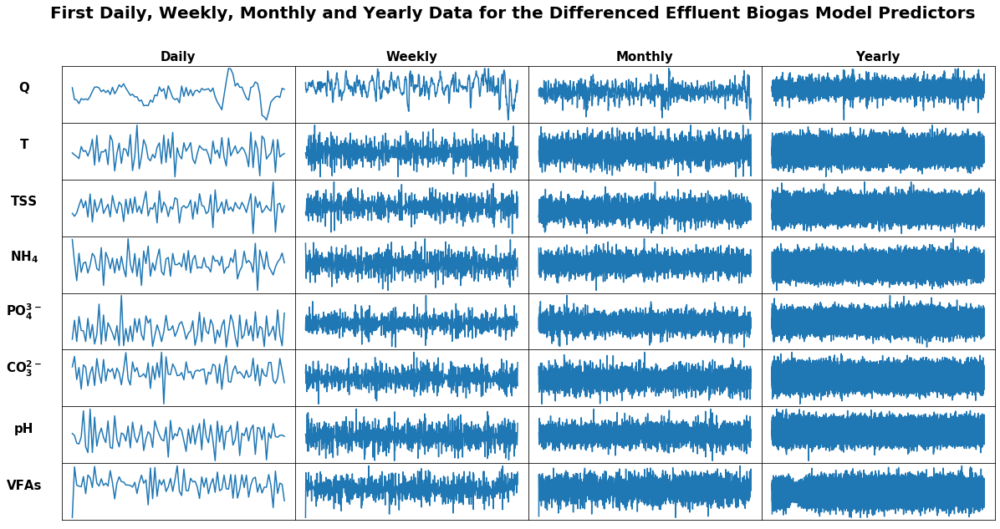

In [53]:
dwmy(X_out_diff, 'First Daily, Weekly, Monthly and Yearly Data for the Differenced Effluent Biogas Model Predictors',10)

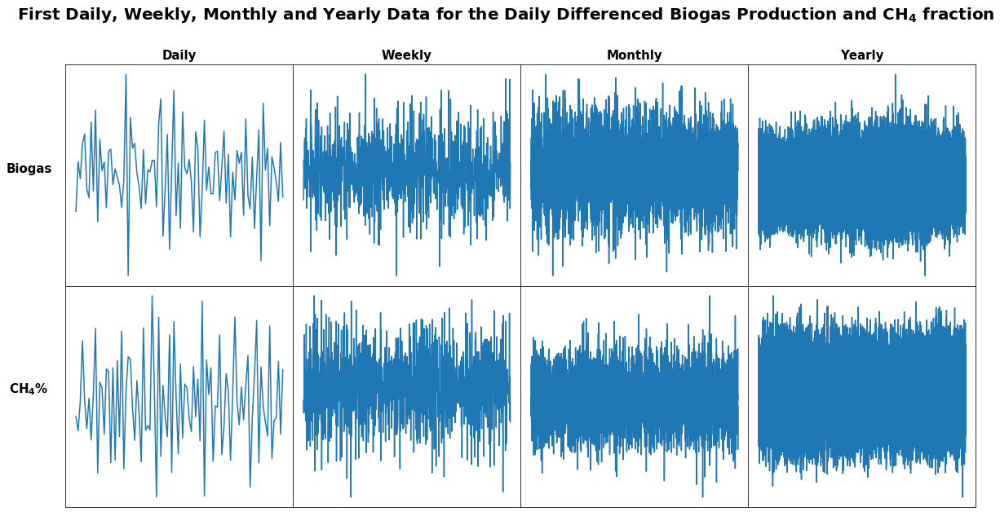

In [54]:
dwmy(y_diff, r'First Daily, Weekly, Monthly and Yearly Data for the Daily Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

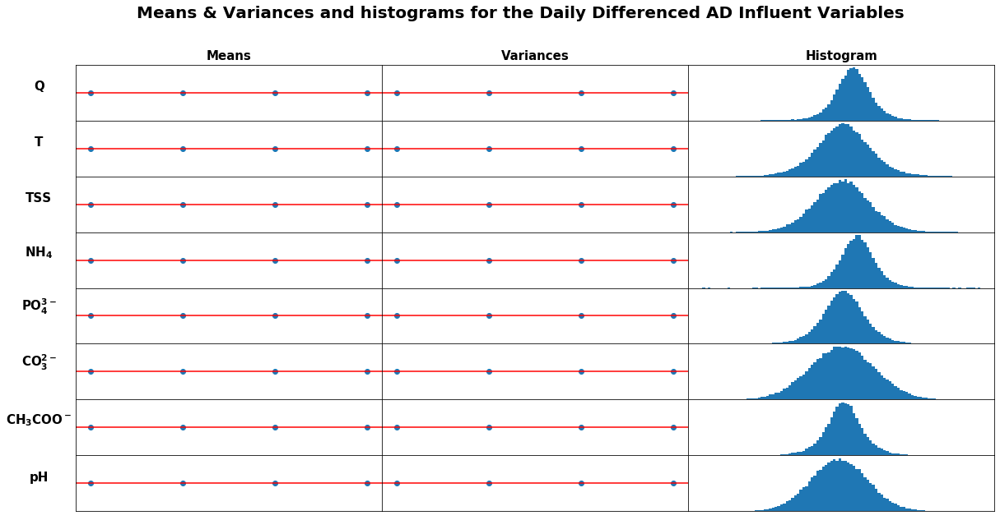

In [55]:
mvh(X_in_diff, 'Means & Variances and histograms for the Daily Differenced AD Influent Variables', 10)

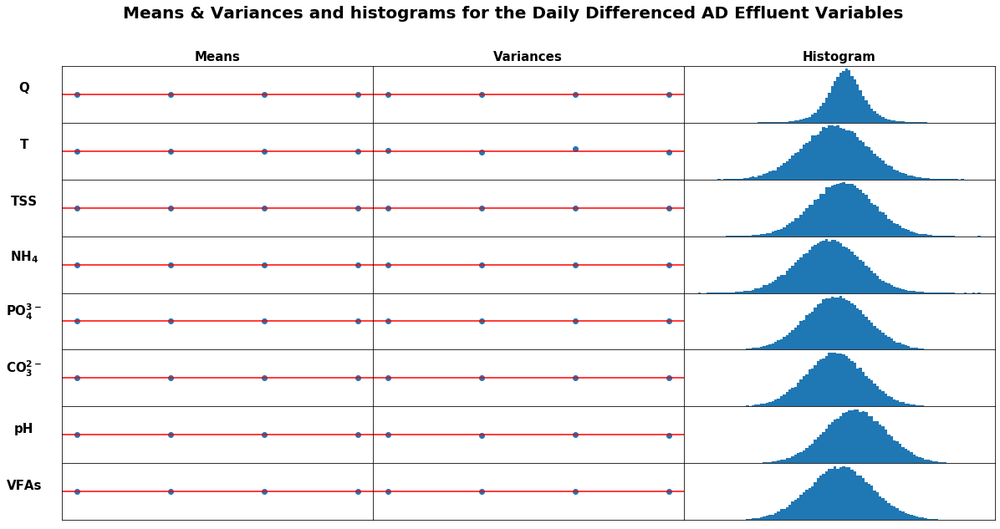

In [56]:
mvh(X_out_diff, 'Means & Variances and histograms for the Daily Differenced AD Effluent Variables', 10)

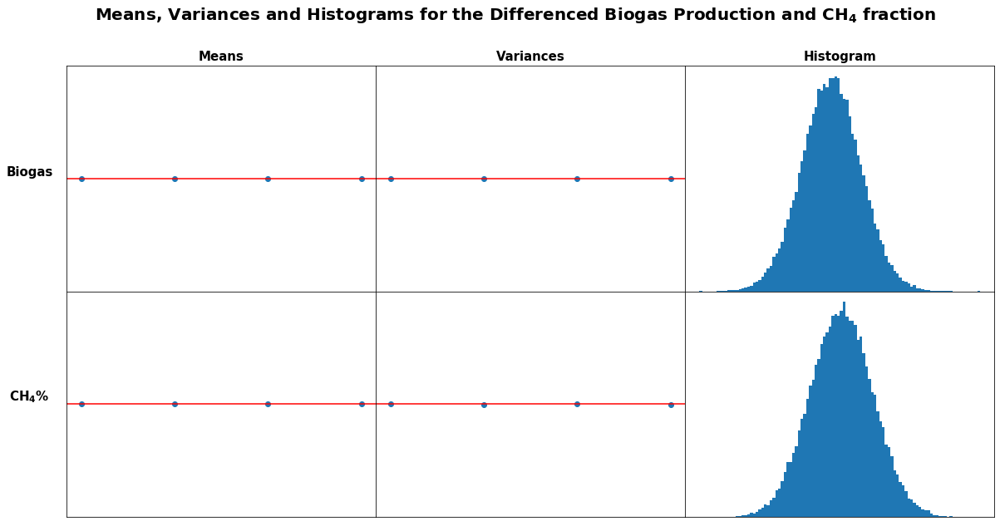

In [57]:
mvh(y_diff, r'Means, Variances and Histograms for the Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

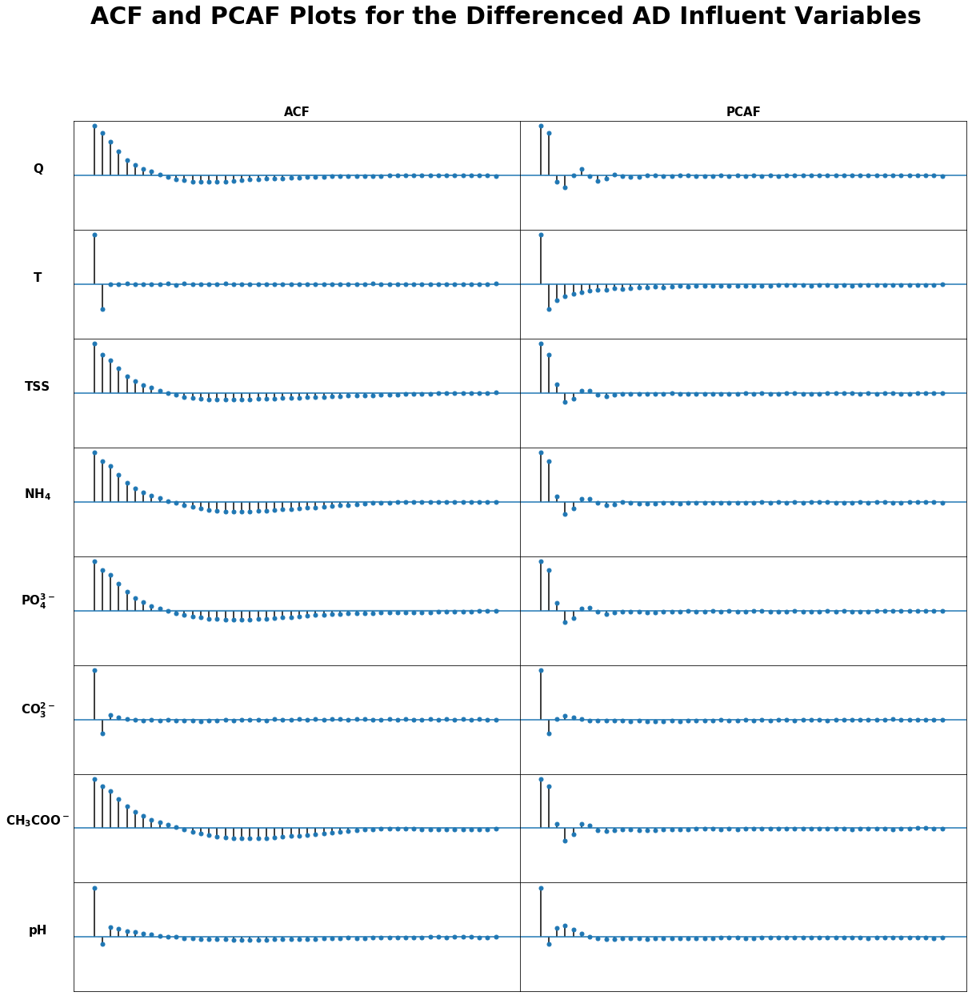

In [58]:
ACFPACF(X_in_diff, 'ACF and PCAF Plots for the Differenced AD Influent Variables', 20)

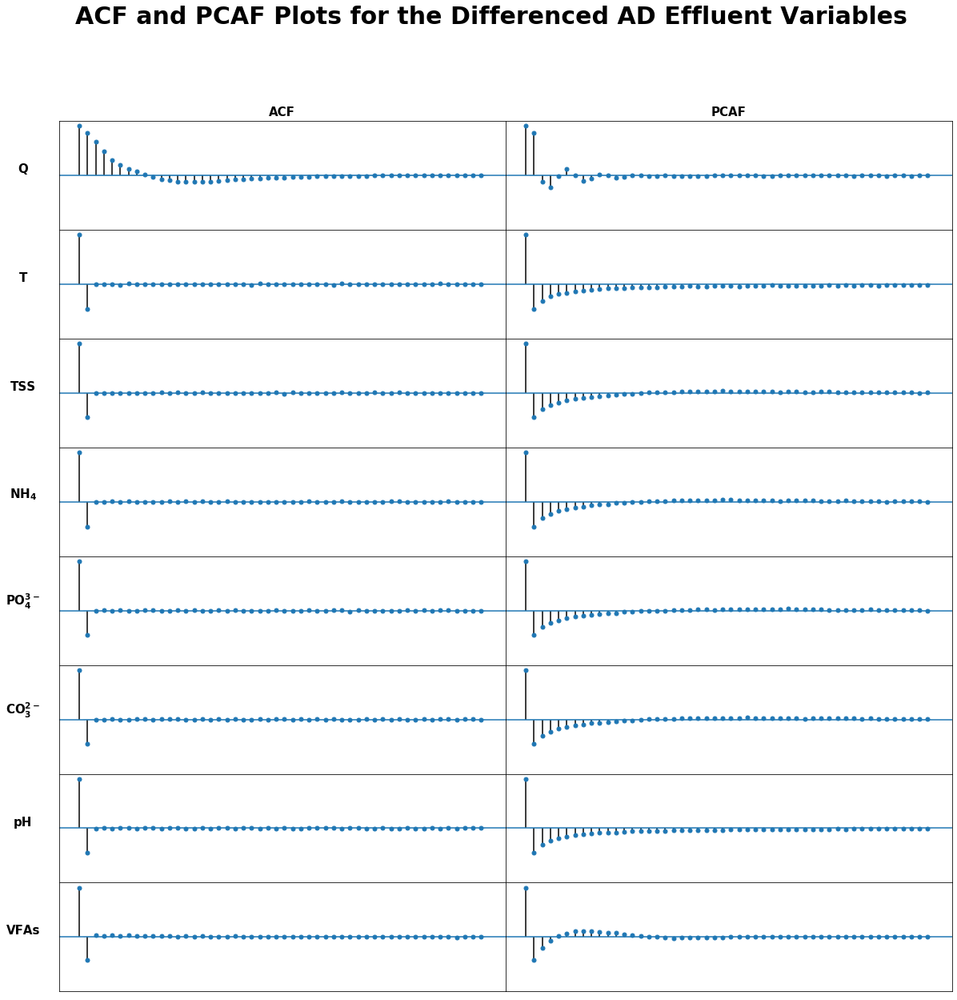

In [59]:
ACFPACF(X_out_diff, 'ACF and PCAF Plots for the Differenced AD Effluent Variables', 20)

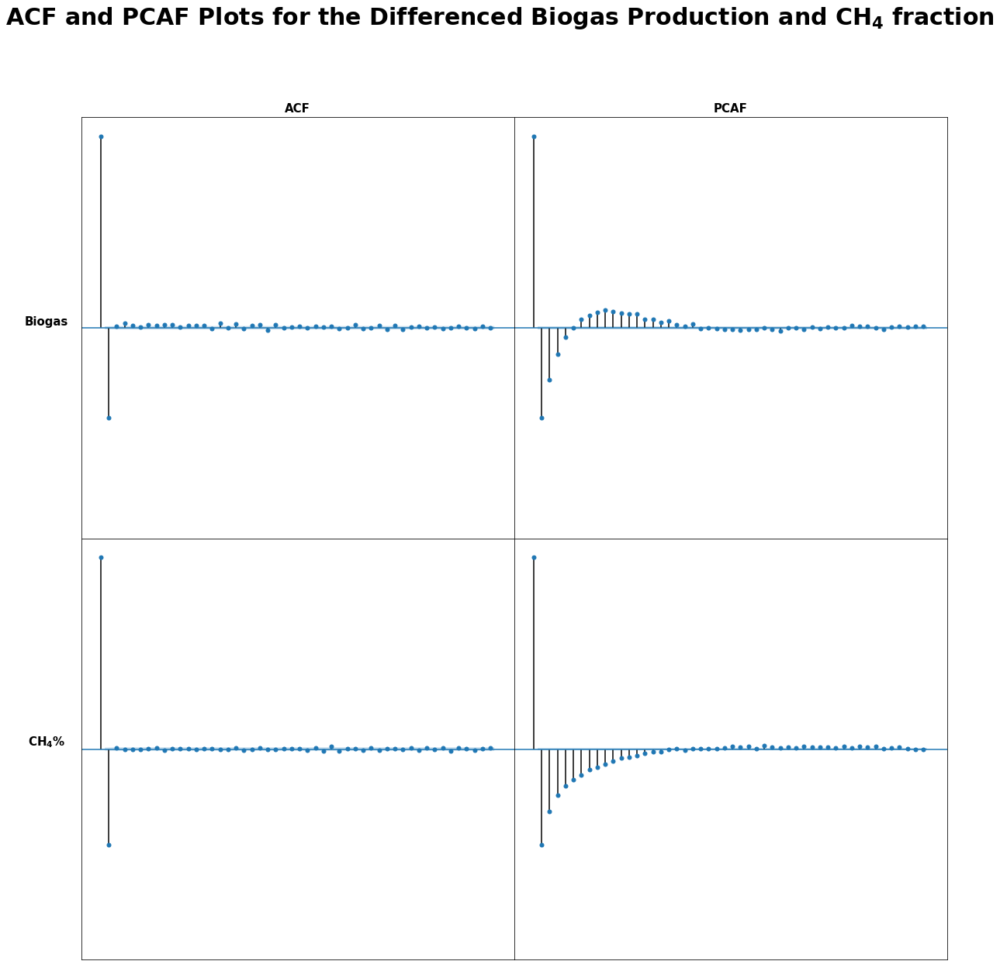

In [60]:
ACFPACF(y_diff, r'ACF and PCAF Plots for the Differenced Biogas Production and $\mathbf{CH_{4}}$ fraction', 20)

In [63]:
## This function plots the three PACF plots side by side for the variables

def PACF3(X,X2,X3,title,graphsize):
       
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
            X2 = X2.drop(['kLa'], axis = 1)
            X3 = X3.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['PACF Original Data', 'PACF Daily Differenced', 'PACF Daily and First Differenced']

    for i in range(number_of_variables):
        plot_pacf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_pacf(X2[X2.columns.tolist()[i]], ax = ax[i,1], title = None)
        plot_pacf(X3[X3.columns.tolist()[i]], ax = ax[i,2], title = None)
        
    
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)




In [64]:
## This function plots the three ACF plots side by side for the variables

def ACF3(X,X2,X3,title,graphsize):
       
    #This drops the kLa column in the non-aerated tanks, since it does not compute,
    #and the data is also just a constant 0, so not much information to grab!
    # This works even though the actual mean of all columns is zero, due to numerical precision
    
    if 'kLa' in X.columns:
        if (np.mean(X['kLa']) == 0.0):
            X = X.drop(['kLa'], axis = 1)
            X2 = X2.drop(['kLa'], axis = 1)
            X3 = X3.drop(['kLa'], axis = 1)
    
    
    
    #Defining a significance level
    significance_level = 0.167
    fig, ax = plt.subplots(X.shape[1],3, figsize=(20,graphsize))
    fig.suptitle(title, fontsize = 30, fontweight = 'bold')
    fig.subplots_adjust(hspace = 0, wspace = 0)
    number_of_variables = X.shape[1]
    plot_names = ['ACF Original Data', 'ACF Daily Differenced', 'ACF Daily and First Differenced']

    for i in range(number_of_variables):
        plot_acf(X[X.columns.tolist()[i]], ax = ax[i,0], title = None)
        plot_acf(X2[X2.columns.tolist()[i]], ax = ax[i,1], title = None)
        plot_acf(X3[X3.columns.tolist()[i]], ax = ax[i,2], title = None)
        
    
    for i in range(number_of_variables):
        for j in range(3):
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            ax[i,j].xaxis.set_visible(False)
            ax[i,0].set_ylabel(X.columns.tolist()[i], rotation = 0, labelpad = 45, fontweight = 'bold', fontsize = 15)
            ax[0,j].set_title(plot_names[j], fontweight = 'bold', fontsize = 15)
            ax[i,j].set_ylim(-1.1,1.1)





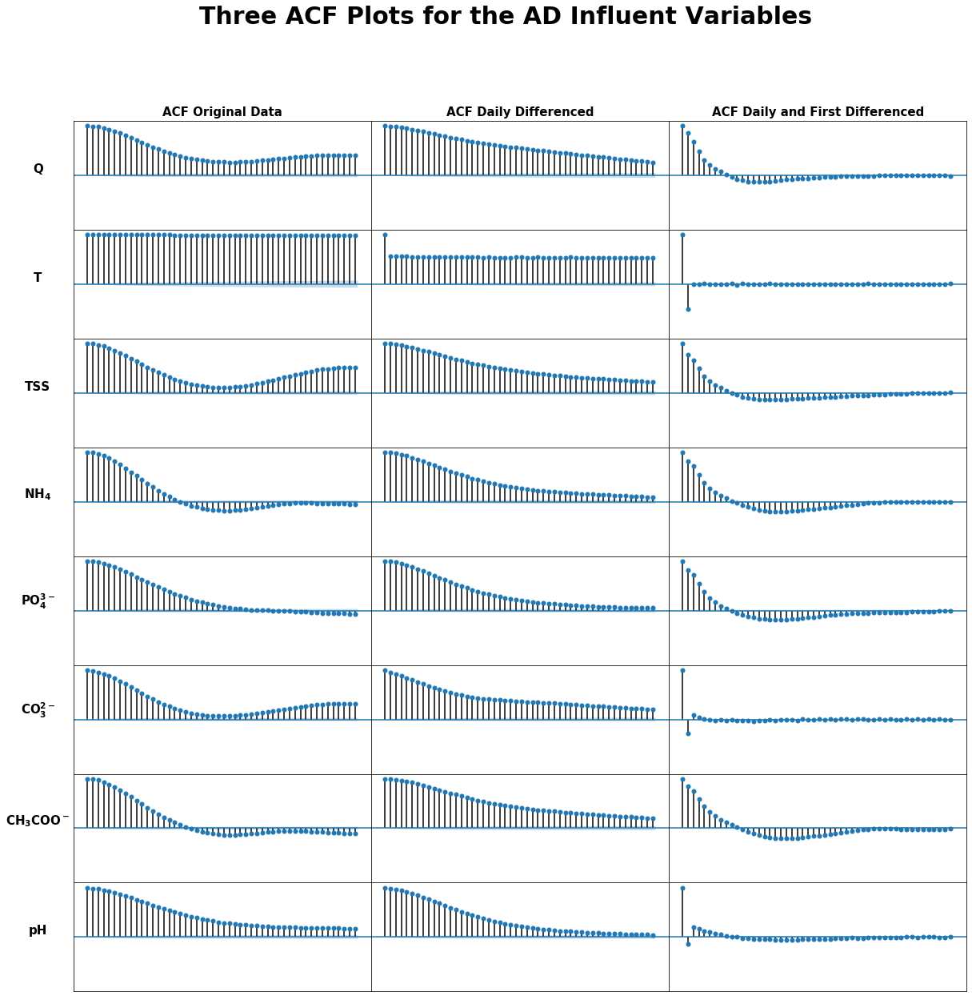

In [65]:
ACF3(X_in, X_in_daily_diff, X_in_diff, 'Three ACF Plots for the AD Influent Variables', 20)

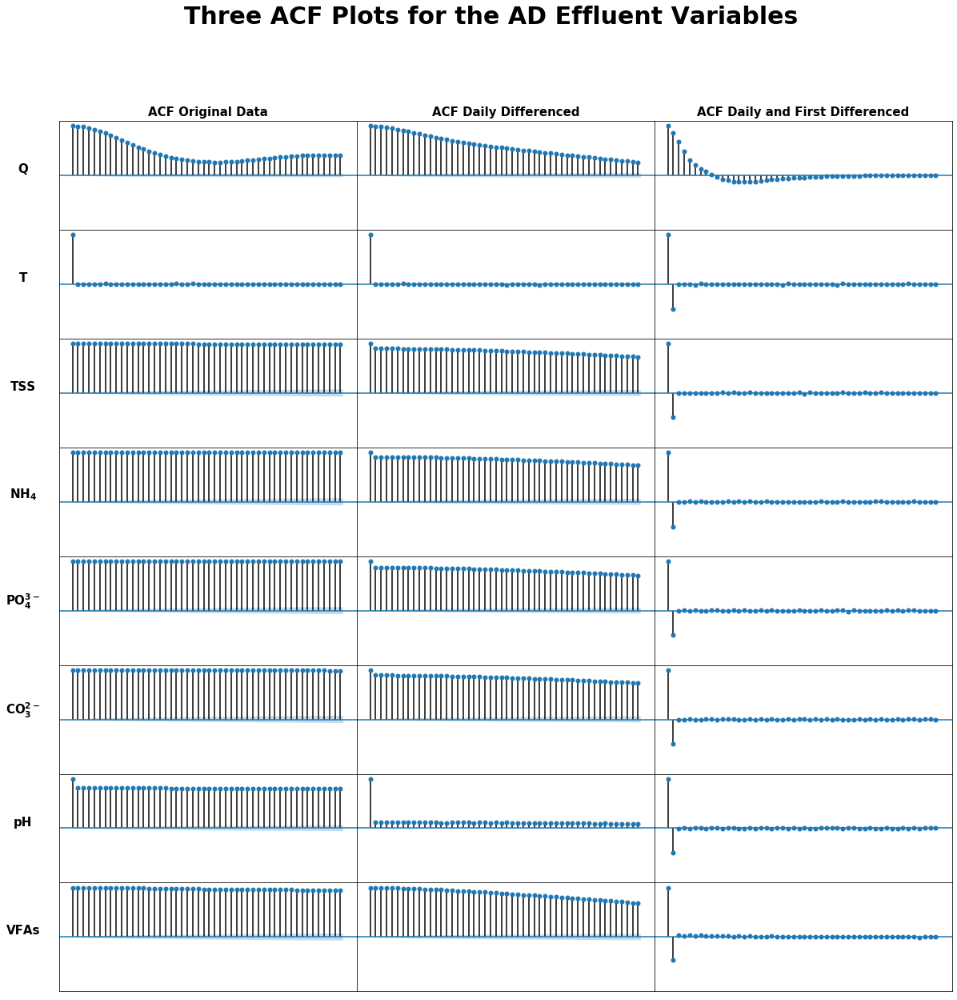

In [66]:
ACF3(X_out, X_out_daily_diff, X_out_diff, 'Three ACF Plots for the AD Effluent Variables', 20)

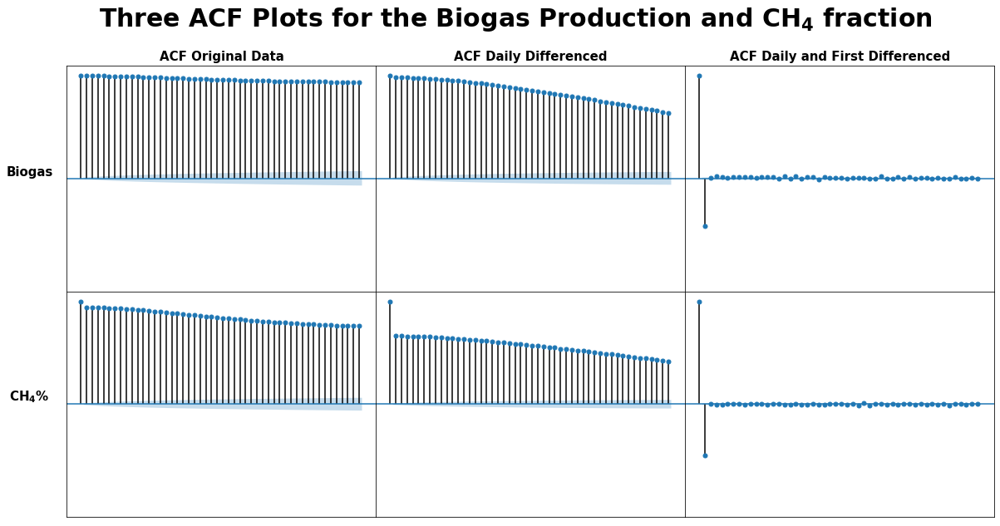

In [67]:
ACF3(yscale, y_daily_diff, y_diff, r'Three ACF Plots for the Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

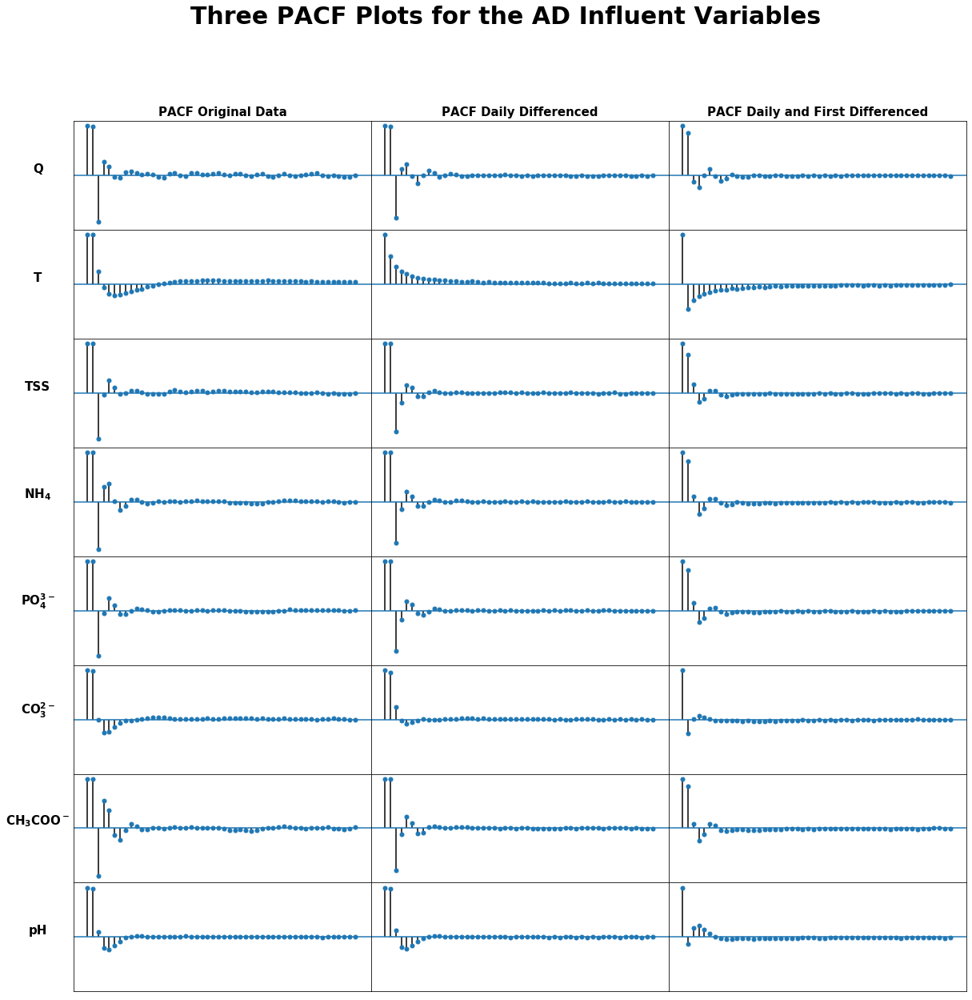

In [68]:
PACF3(X_in, X_in_daily_diff, X_in_diff, 'Three PACF Plots for the AD Influent Variables', 20)

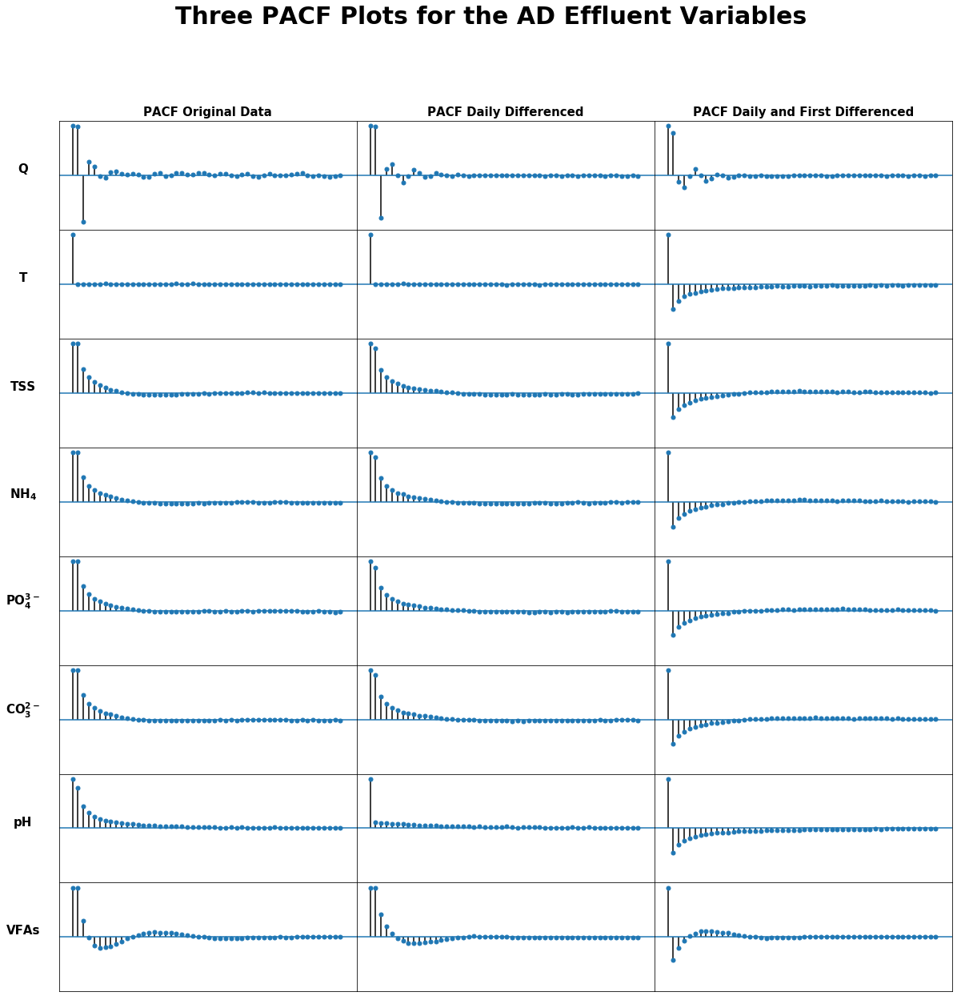

In [69]:
PACF3(X_out, X_out_daily_diff, X_out_diff, 'Three PACF Plots for the AD Effluent Variables', 20)

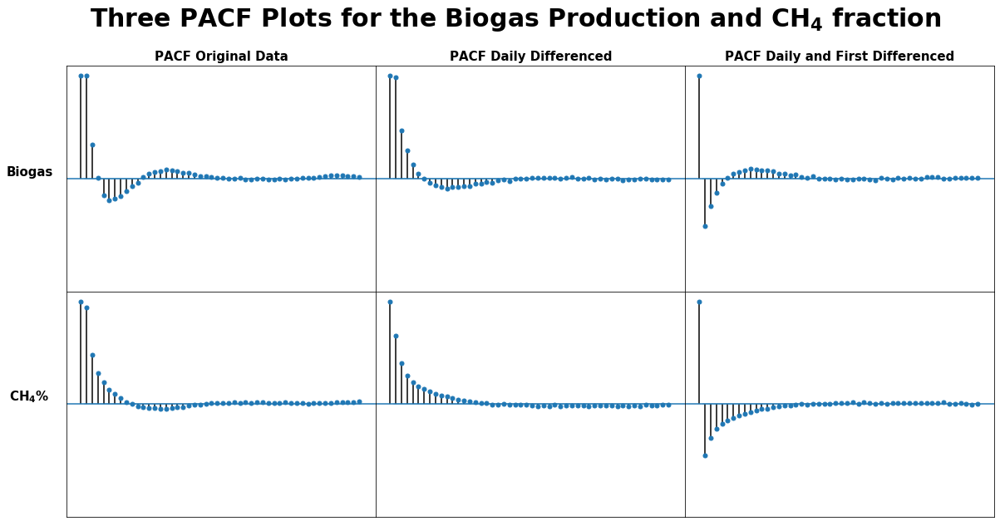

In [70]:
PACF3(yscale, y_daily_diff, y_diff, r'Three PACF Plots for the Biogas Production and $\mathbf{CH_{4}}$ fraction', 10)

## Now we will try to combine [X|Y] and model it as a VAR process

In [11]:
# Load the file with the pymatreader function read_mat
data_mat_XY = read_mat('Data_XY.mat')

In [12]:
# Defining column names
#Input variable names
Header_XY_in = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$', r'$\mathbf{CH_3COO^-}$','pH', 'Biogas', r'$\mathbf{CH_4}$']

# Variable names for the second biogas model that takes its input from the effluent
# of the anaerobic digester
Header_XY_out = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$','pH', 'VFAs', 'Biogas', r'$\mathbf{CH_4}$']


# Creating a Pandas dataframe for the 2 different data sets.


AD_influent = pd.DataFrame(data_mat_XY['AD_influent'], columns = Header_XY_in)
AD_effluent = pd.DataFrame(data_mat_XY['AD_effluent'], columns = Header_XY_out)

In [13]:
AD_influent_diff = AD_influent.diff(96).diff().dropna()
AD_effluent_diff = AD_effluent.diff(96).diff().dropna()

In [14]:
# The following matrix is used to revert the predictions back to the actual values
# The 13978 is the length of the differencing and the 97 are the extra values required from the original data matrix
# To transform back the predictions since we did a daily (96) difference and a first difference (1)
y_test_rev = y[-(13978+97):]

def rev_pred(original, diff):
    
    X = []
        
    for i in range(len(diff)):
        k = diff[i] - original[i] + original[i+1] + original[i+96]
        X.append(k)

    
    return X




In [16]:
class SubVAR:
    def __init__(self, predictions, y_orig):
        self.rev_pred = rev_pred(y_orig[-(13978+97):].values, predictions)
        self.residuals = y_orig[-13978:]-self.rev_pred
        self.RMSE = np.mean((self.residuals)**2)**0.5

In [81]:
class VectorAutoRegressionInsample:
    def __init__(self, X, lag):
        # The 55813 correspond to the length of the training set. This produces a predictions vector with
        # the same length as the test set
        self.model = VAR(X[:55813-lag])
        self.model1 = VAR(X[55813-lag:])
        self.model_fit = self.model.fit(lag)
        self.final = deepcopy(self.model_fit)
        self.predictions = self.model1.predict(self.model_fit.params, lags = lag)
        self.biogas = SubVAR(self.predictions[:,-2], y[y.columns.tolist()[0]])
        self.CH4 = SubVAR(self.predictions[:,-1], y[y.columns.tolist()[1]])

In [82]:
In_VAR = VectorAutoRegressionInsample(AD_influent_diff, 2)
Out_VAR = VectorAutoRegressionInsample(AD_effluent_diff, 2)

/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


## Create lagged versions of OLS, PLS, and RF

In [19]:
#Reinitialising y so it isn't scaled

y = pd.DataFrame(data_mat['Digester_out_y'], columns = Header_y)
y_diff = y.diff(96).diff().dropna()

In [20]:
def update_columns(dataset, lags):
    ogstring = dataset.columns.tolist()
    string = dataset.columns.tolist()
    stringa = []
    for i in range(len(lags)):
        for j in range(len(string)):
            if ogstring[j][-1] == '$':
                if ogstring[j][-4] == '_':
                    string[j] = ogstring[j][:-3] + '{' + ogstring[j][-3] + '_{t-' + f'{lags[i]}' + '}}}$'
                else:
                    string[j] = ogstring[j][:-2]+'_{t-'+f'{lags[i]}'+'}}$'
            elif ogstring[j][-1] is not '$':
                string[j] = '$\\mathbf{' + ogstring[j] + '_{t-' + f'{lags[i]}' + '}}$'
        

        stringa += string
    stringa = ogstring + stringa
    return stringa

In [21]:
def lagdif(dataset, lags):
    X = dataset
    Xlag = pd.DataFrame()
    Xlist = []
    Xlist.append(X)
    for i in range(len(lags)):
        Xlag = pd.concat([Xlag, X.shift(lags[i])], axis = 1).dropna()

    
    Xlag.columns = update_columns(X, lags[1:])
    

    return Xlag

In [22]:
In_diff_lag = pd.DataFrame(lagdif(X_in_diff, [1,2]))
Out_diff_lag = pd.DataFrame(lagdif(X_out_diff, [1,2]))

In [23]:
# A test_size of 0.20028 makes it so that the test-set is equivalent to the one used for the initial modelling
In_diff_lag_train, In_diff_lag_test, Out_diff_lag_train, Out_diff_lag_test = train_test_split(In_diff_lag, Out_diff_lag, test_size = 0.20028, shuffle = False)

In [35]:
# Creating the training data for the lagged versions
y_train_diff_lag = y_diff[2:-13978]
y_train_diff = y_diff[:-13978]
y_test = y[-13978:]

In [25]:
class NoCVMethod:
    def __init__(self, X_train, y_train, X_test, y_test, y, Method):
        self.clf = Method
        self.clf.fit(X_train, y_train)
        self.predictions = self.clf.predict(X_test)
        self.rev_preds = rev_pred(y[-(13978+97):].values,self.predictions)
        self.residuals = y_test - self.rev_preds
        self.RMSE = np.mean((self.residuals)**2)**0.5
        self.final = deepcopy(self.clf)

In [26]:
class CVMethod:
    def __init__(self, X_train, y_train, X_test, y_test, y, param_dict, Method):
        self.pipeline = Pipeline([
            ('scale', StandardScaler()),
            ('clf', Method)
        ]) 
        self.param_grid = param_dict
        self.grid = GridSearchCV(self.pipeline, param_grid = self.param_grid, cv = 3, verbose = False, n_jobs = -1)
        self.grid.fit(X_train, y_train)
        self.predictions = self.grid.predict(X_test).ravel()
        self.rev_preds = rev_pred(y[-(13978+97):].values,self.predictions)
        self.residuals = y_test - self.rev_preds
        self.RMSE = np.mean((self.residuals)**2)**0.5

In [27]:
class Different_variables:
    def __init__(self, X_train, y_train, X_test, y_test, Method):
        self.biogas = NoCVMethod(X_train, y_train[y_train.columns.tolist()[0]], X_test, y_test[y_test.columns.tolist()[0]], y[y.columns.tolist()[0]], Method)
        self.CH4 = NoCVMethod(X_train, y_train[y_train.columns.tolist()[1]], X_test, y_test[y_test.columns.tolist()[1]], y[y.columns.tolist()[1]], Method)
        

In [28]:
class CVDifferent_variables:
    def __init__(self, X_train, y_train, X_test, y_test, param_dict, Method):
        self.biogas = CVMethod(X_train, y_train[y_train.columns.tolist()[0]], X_test, y_test[y_test.columns.tolist()[0]], y[y.columns.tolist()[0]], param_dict, Method)
        self.CH4 = CVMethod(X_train, y_train[y_train.columns.tolist()[1]], X_test, y_test[y_test.columns.tolist()[1]], y[y.columns.tolist()[1]], param_dict, Method)
        

In [29]:
class Different_methods:
    def __init__(self, X_train, y_train, X_test):
        self.OLS = Different_variables(X_train, y_train, X_test, y_test, LinearRegression())
        self.PLS = CVDifferent_variables(X_train, y_train, X_test, y_test, param_PLS, PLSRegression())
        self.RF = Different_variables(X_train, y_train, X_test, y_test, RandomForestRegressor(n_estimators = 100))

In [30]:
param_PLS = {'clf__n_components':  [int(x) for x in np.linspace(1,9,9)]}

In [31]:
Lag_regression_In = Different_methods(In_diff_lag_train, y_train_diff_lag, In_diff_lag_test)

In [33]:
Lag_regression_Out = Different_methods(Out_diff_lag_train, y_train_diff_lag, Out_diff_lag_test)

## We can also attempt the regression without lagged variables and just the differenced data

In [37]:
# A test_size of 0.20027 makes it so that the test-set is equivalent to the one used for the initial modelling
X_in_diff_train, X_in_diff_test, X_out_diff_train, X_out_diff_test = train_test_split(X_in_diff, X_out_diff, test_size = 0.20027, shuffle = False)

In [38]:
Diff_regression_in = Different_methods(X_in_diff_train, y_train_diff, X_in_diff_test)

In [39]:
Diff_regression_out = Different_methods(X_out_diff_train, y_train_diff, X_out_diff_test)

In [245]:
VAR_keys = [In_VAR, Out_VAR]
lag_keys = [Lag_regression_In, Lag_regression_Out]
diff_keys = [Diff_regression_in, Diff_regression_out]

#Create empty dataframe for the VAR 
VAR_RMSE = pd.DataFrame()

#Create empty dataframes for the regressions on the lagged data
OLS_lag_RMSE = pd.DataFrame()
PLS_lag_RMSE = pd.DataFrame()
RF_lag_RMSE = pd.DataFrame()

#Create empty dataframes for the regressions on the differenced data
OLS_dif_RMSE = pd.DataFrame()
PLS_dif_RMSE = pd.DataFrame()
RF_dif_RMSE = pd.DataFrame()

for key in VAR_keys:
    v1 = pd.DataFrame({'Biogas': [key.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.CH4.RMSE]})
    VAR_RMSE = VAR_RMSE.append(v1)
    
for key in lag_keys:
    a1 = pd.DataFrame({'Biogas': [key.OLS.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.OLS.CH4.RMSE]})
    OLS_lag_RMSE = OLS_lag_RMSE.append(a1)
    
    b1 = pd.DataFrame({'Biogas': [key.PLS.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.PLS.CH4.RMSE]})
    PLS_lag_RMSE = PLS_lag_RMSE.append(b1)
    
    c1 = pd.DataFrame({'Biogas': [key.RF.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.RF.CH4.RMSE]})
    RF_lag_RMSE = RF_lag_RMSE.append(c1)

    
for key in diff_keys:
    d1 = pd.DataFrame({'Biogas': [key.OLS.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.OLS.CH4.RMSE]})
    OLS_dif_RMSE = OLS_dif_RMSE.append(d1)
    
    e1 = pd.DataFrame({'Biogas': [key.PLS.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.PLS.CH4.RMSE]})
    PLS_dif_RMSE = PLS_dif_RMSE.append(e1)
    
    f1 = pd.DataFrame({'Biogas': [key.RF.biogas.RMSE], r'$\mathbf{CH_{4}\%}$':[key.RF.CH4.RMSE]})
    RF_dif_RMSE = RF_dif_RMSE.append(f1)
    

VAR_RMSE.index = ['Influent', 'Effluent']
OLS_lag_RMSE.index = ['Influent', 'Effluent']
PLS_lag_RMSE.index = ['Influent', 'Effluent']
RF_lag_RMSE.index = ['Influent', 'Effluent']
OLS_dif_RMSE.index = ['Influent', 'Effluent']
PLS_dif_RMSE.index = ['Influent', 'Effluent']
RF_dif_RMSE.index = ['Influent', 'Effluent']
    


In [246]:
OLS_lag_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.422603,0.002969
Effluent,13.424609,0.002969


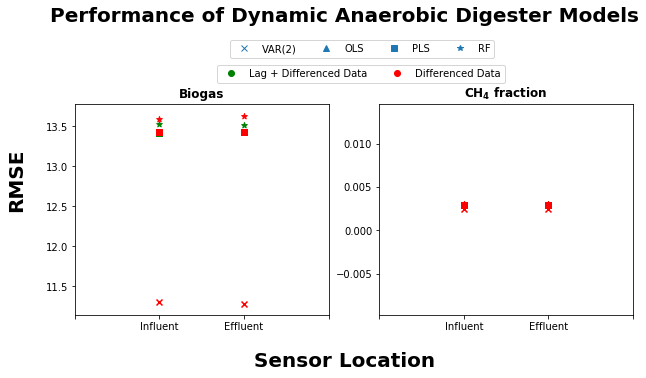

In [42]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
variables = ['Biogas',r'$\mathbf{CH_{4}\%}$']
index = [1,2]


fig.suptitle('Performance of Dynamic Anaerobic Digester Models', fontsize = 20, fontweight = 'bold')
ax = ax.ravel()
for i in range(2):
    ax[i].scatter(index, VAR_RMSE[variables[i]], marker = 'x',color = 'r')
    ax[i].scatter(index, OLS_lag_RMSE[variables[i]], marker = '^', color = 'g')
    ax[i].scatter(index, PLS_lag_RMSE[variables[i]], marker = 's', color = 'g')
    ax[i].scatter(index, RF_lag_RMSE[variables[i]], marker = '*', color = 'g')
    ax[i].scatter(index, OLS_dif_RMSE[variables[i]], marker = '^', color = 'r')
    ax[i].scatter(index, PLS_dif_RMSE[variables[i]], marker = 's', color = 'r')
    ax[i].scatter(index, RF_dif_RMSE[variables[i]], marker = '*', color = 'r')
    ax[i].set_xticks([0,1,2,3])
    ax[i].set_xticklabels(['','Influent','Effluent',''])
    ax[i].set_title(Header_y[i], fontweight = 'bold')
    
fig.text(0.031, 0.5,'RMSE', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, -0.02,'Sensor Location', ha = 'center', fontsize = 20, fontweight = 'bold')

legend_elements = [Line2D([0], [0],linestyle='None', marker = 'x', label = 'VAR(2)'),
                  Line2D([0],[0],linestyle='None', marker = '^', label = 'OLS'),
                  Line2D([0],[0], linestyle='None',marker = 's', label = 'PLS'),
                  Line2D([0],[0], linestyle='None',marker = '*', label = 'RF')]


legend_elements2 = [Line2D([0],[0], linestyle='None',marker = 'o', color = 'g',  label = 'Lag + Differenced Data'),
                  Line2D([0],[0], linestyle='None',marker = 'o', color = 'r', label = 'Differenced Data')]

legend2 = plt.legend(handles = legend_elements2,
                    loc = (-0.64, 1.1),
                    borderaxespad = 0.1,
                    ncol = 2)


legend1 = plt.legend(handles=legend_elements, 
          loc = (-0.59,1.22),
                    ncol = 4)

fig.add_artist(legend2)


fig.subplots_adjust(top=0.71)



In [72]:
Initial_OLS_RMSE = pd.read_csv('Initial_OLS_RMSE_AD.csv', index_col = 0)
Initial_PLS_RMSE = pd.read_csv('Initial_PLS_RMSE_AD.csv', index_col = 0)
Initial_KNN_RMSE = pd.read_csv('Initial_KNN_RMSE_AD.csv', index_col = 0)
Initial_RF_RMSE = pd.read_csv('Initial_RF_RMSE_AD.csv', index_col = 0)

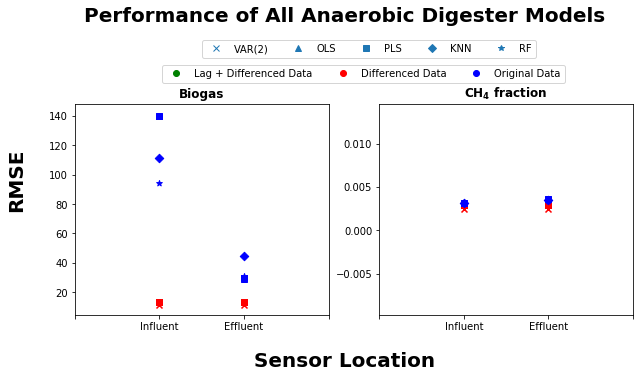

In [73]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
variables = ['Biogas',r'$\mathbf{CH_{4}\%}$']
index = [1,2]


fig.suptitle('Performance of All Anaerobic Digester Models', fontsize = 20, fontweight = 'bold')
ax = ax.ravel()
for i in range(2):
    ax[i].scatter(index, VAR_RMSE[variables[i]], marker = 'x',color = 'r')
    ax[i].scatter(index, OLS_lag_RMSE[variables[i]], marker = '^', color = 'g')
    ax[i].scatter(index, PLS_lag_RMSE[variables[i]], marker = 's', color = 'g')
    ax[i].scatter(index, RF_lag_RMSE[variables[i]], marker = '*', color = 'g')
    ax[i].scatter(index, OLS_dif_RMSE[variables[i]], marker = '^', color = 'r')
    ax[i].scatter(index, PLS_dif_RMSE[variables[i]], marker = 's', color = 'r')
    ax[i].scatter(index, RF_dif_RMSE[variables[i]], marker = '*', color = 'r')
    ax[i].scatter(index, Initial_OLS_RMSE[variables[i]], marker = '^', color = 'b')
    ax[i].scatter(index, Initial_PLS_RMSE[variables[i]], marker = 's', color = 'b')
    ax[i].scatter(index, Initial_KNN_RMSE[variables[i]], marker = 'D', color = 'b')
    ax[i].scatter(index, Initial_RF_RMSE[variables[i]], marker = '*', color = 'b')
    ax[i].set_xticks([0,1,2,3])
    ax[i].set_xticklabels(['','Influent','Effluent',''])
    ax[i].set_title(Header_y[i], fontweight = 'bold')
    
fig.text(0.031, 0.5,'RMSE', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, -0.02,'Sensor Location', ha = 'center', fontsize = 20, fontweight = 'bold')

legend_elements = [Line2D([0], [0],linestyle='None', marker = 'x', label = 'VAR(2)'),
                  Line2D([0],[0],linestyle='None', marker = '^', label = 'OLS'),
                  Line2D([0],[0], linestyle='None',marker = 's', label = 'PLS'),
                   Line2D([0],[0], linestyle='None',marker = 'D', label = 'KNN'),
                  Line2D([0],[0], linestyle='None',marker = '*', label = 'RF')]


legend_elements2 = [Line2D([0],[0], linestyle='None',marker = 'o', color = 'g',  label = 'Lag + Differenced Data'),
                  Line2D([0],[0], linestyle='None',marker = 'o', color = 'r', label = 'Differenced Data'),
                   Line2D([0],[0], linestyle='None',marker = 'o', color = 'b', label = 'Original Data')]

legend2 = plt.legend(handles = legend_elements2,
                    loc = (-0.855, 1.1),
                    borderaxespad = 0.1,
                    ncol = 3)


legend1 = plt.legend(handles=legend_elements, 
          loc = (-0.7,1.22),
                    ncol = 5)

fig.add_artist(legend2)


fig.subplots_adjust(top=0.71)

In [244]:
VAR_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,11.297532,0.002421
Effluent,11.274911,0.002422


In [46]:
OLS_lag_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.422603,0.002969
Effluent,13.424609,0.002969


In [47]:
PLS_lag_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.422653,0.002969
Effluent,13.424484,0.002969


In [48]:
RF_lag_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.536318,0.002991
Effluent,13.522880,0.002992


In [49]:
OLS_dif_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.432765,0.002969
Effluent,13.434554,0.002969


In [50]:
PLS_dif_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.432755,0.002969
Effluent,13.434670,0.002969


In [51]:
RF_dif_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,13.594218,0.003003
Effluent,13.633361,0.003007


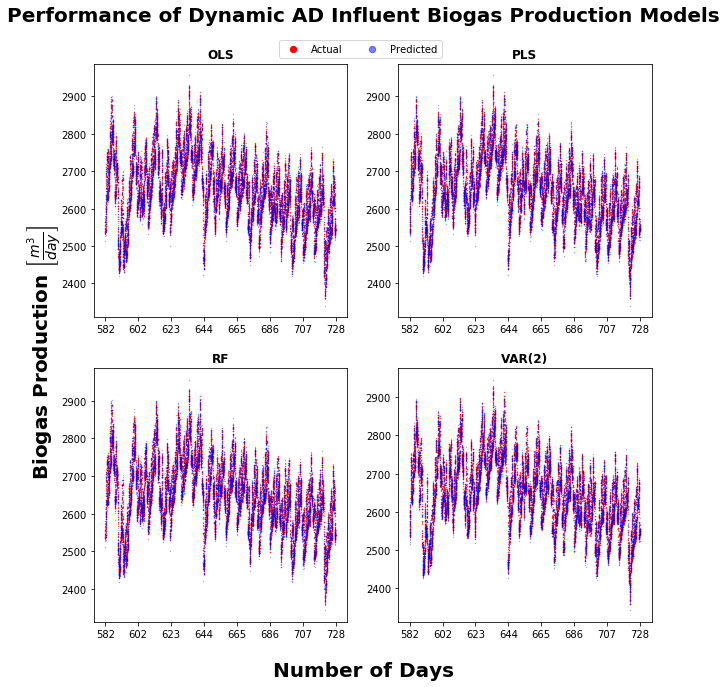

In [52]:
# Performance of Influent Digester Models 1

x_axis = y_test.index.tolist()

fig, ax = plt.subplots(2,2, figsize=(10,10))
ax = ax.flatten()

fig.suptitle('Performance of Dynamic AD Influent Biogas Production Models', fontsize = 20, fontweight = 'bold')

ax[0].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_In.OLS.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_In.PLS.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_In.RF.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[3].scatter(x_axis, In_VAR.biogas.rev_pred, s = 0.1, color = 'b', alpha = 0.5)


titles = ['OLS','PLS','RF','VAR(2)']



fig.text(0.031, 0.5,'Biogas Production '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')




for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

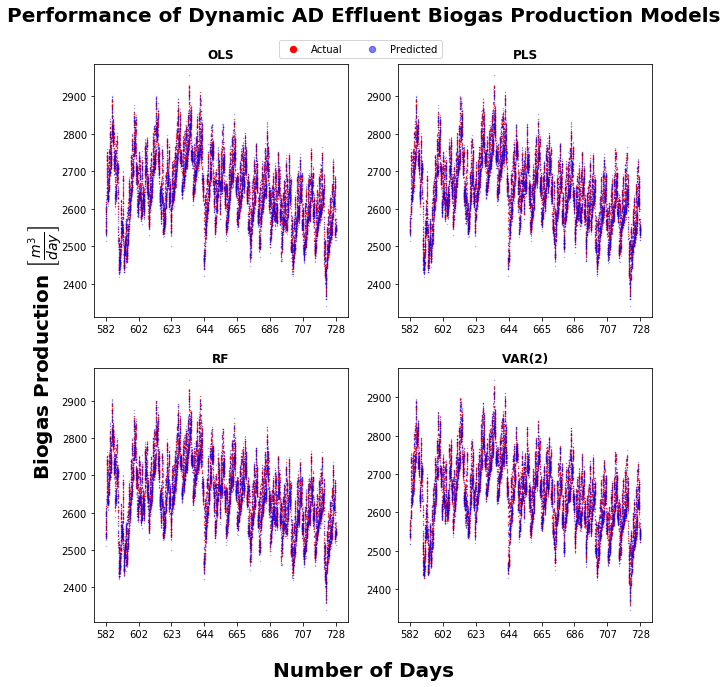

In [53]:
# Performance of Influent Digester Models 2

x_axis = y_test.index.tolist()

fig, ax = plt.subplots(2,2, figsize=(10,10))
ax = ax.flatten()

fig.suptitle('Performance of Dynamic AD Effluent Biogas Production Models', fontsize = 20, fontweight = 'bold')

ax[0].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_Out.OLS.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_Out.PLS.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[2].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_Out.RF.biogas.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test['Biogas'], s = 0.1, color = 'r')
ax[3].scatter(x_axis, Out_VAR.biogas.rev_pred, s = 0.1, color = 'b', alpha = 0.5)


titles = ['OLS', 'PLS', 'RF', 'VAR(2)']    



fig.text(0.031, 0.5,'Biogas Production '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')




for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

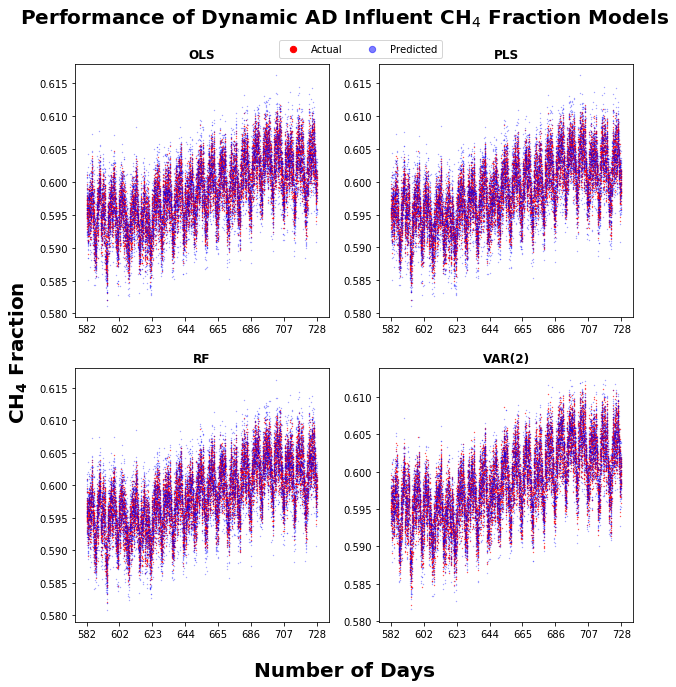

In [54]:
# Performance of Influent Digester Models 1

x_axis = y_test.index.tolist()

fig, ax = plt.subplots(2,2, figsize=(10,10))
ax = ax.flatten()

fig.suptitle(r'Performance of Dynamic AD Influent CH$_4$ Fraction Models', fontsize = 20, fontweight = 'bold')

ax[0].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_In.OLS.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_In.PLS.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)

ax[2].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_In.RF.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[3].scatter(x_axis, In_VAR.CH4.rev_pred, s = 0.1, color = 'b', alpha = 0.5)


titles = ['OLS','PLS','RF','VAR(2)']



fig.text(0.031, 0.5,r'$\mathbf{CH_{4}}$ Fraction', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')



for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

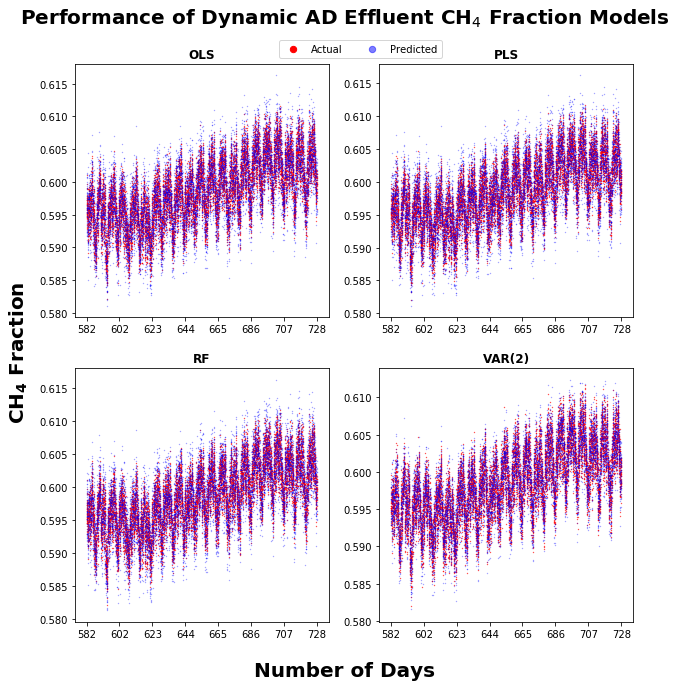

In [55]:
# Performance of Influent Digester Models 1

x_axis = y_test.index.tolist()

fig, ax = plt.subplots(2,2, figsize=(10,10))
ax = ax.flatten()

fig.suptitle(r'Performance of Dynamic AD Effluent CH$_4$ Fraction Models', fontsize = 20, fontweight = 'bold')

ax[0].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[0].scatter(x_axis, Lag_regression_Out.OLS.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[1].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[1].scatter(x_axis, Lag_regression_Out.PLS.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)

ax[2].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[2].scatter(x_axis, Lag_regression_Out.RF.CH4.rev_preds, s = 0.1, color = 'b', alpha = 0.5)
ax[3].scatter(x_axis, y_test[y_test.columns.tolist()[1]], s = 0.1, color = 'r')
ax[3].scatter(x_axis, Out_VAR.CH4.rev_pred, s = 0.1, color = 'b', alpha = 0.5)


titles = ['OLS','PLS','RF','VAR(2)']



fig.text(0.031, 0.5,r'$\mathbf{CH_{4}}$ Fraction', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Number of Days', ha = 'center', fontsize = 20, fontweight = 'bold')



for i in range(4):
    ax[i].set_xticks([int(x) for x in np.linspace(y_test.index.tolist()[0],y_test.index.tolist()[-1], 8)])
    ax[i].set_xticklabels([int(x) for x in np.linspace(582,728,8)])
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.legend(['Actual','Predicted'],
          loc = "upper center",
          borderaxespad = 0.1,
          ncol = 7,
          bbox_to_anchor = (0.5,0.9),
          markerscale = 20)
fig.subplots_adjust(top=0.90)

Text(0.5, 0.05, 'Predicted Biogas Production$ \\left[\\frac{m^3}{day} \\right]$')

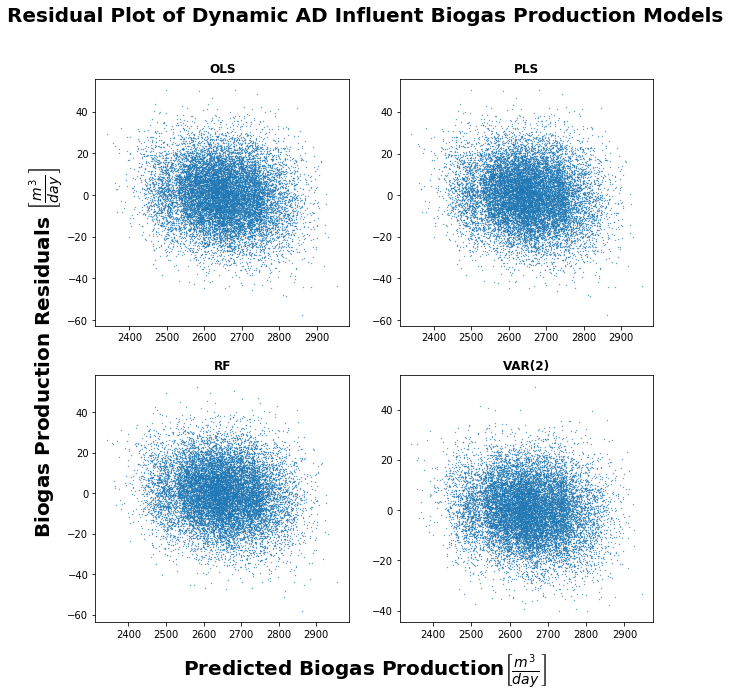

In [56]:
# Residual plot for dynamic AD influent biogas production models
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic AD Influent Biogas Production Models', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_In.OLS.biogas.rev_preds, Lag_regression_In.OLS.biogas.residuals, s = 0.1)
ax[1].scatter(Lag_regression_In.PLS.biogas.rev_preds, Lag_regression_In.PLS.biogas.residuals, s = 0.1)
ax[2].scatter(Lag_regression_In.RF.biogas.rev_preds, Lag_regression_In.RF.biogas.residuals, s = 0.1)
ax[3].scatter(In_VAR.biogas.rev_pred, In_VAR.biogas.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.text(0.031, 0.5,'Biogas Production Residuals '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Predicted Biogas Production'+ r'$ \left[\frac{m^3}{day} \right]$', ha = 'center', fontsize = 20, fontweight = 'bold')




Text(0.5, 0.05, 'Predicted Biogas Production$ \\left[\\frac{m^3}{day} \\right]$')

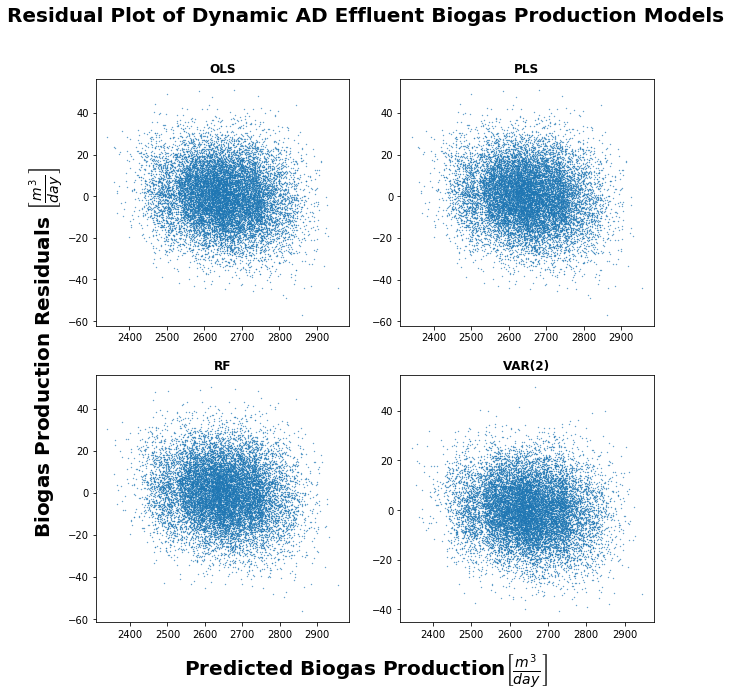

In [57]:
# Residual plot for dynamic AD effluent biogas production models
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic AD Effluent Biogas Production Models', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_Out.OLS.biogas.rev_preds, Lag_regression_Out.OLS.biogas.residuals, s = 0.1)
ax[1].scatter(Lag_regression_Out.PLS.biogas.rev_preds, Lag_regression_Out.PLS.biogas.residuals, s = 0.1)
ax[2].scatter(Lag_regression_Out.RF.biogas.rev_preds, Lag_regression_Out.RF.biogas.residuals, s = 0.1)
ax[3].scatter(Out_VAR.biogas.rev_pred, Out_VAR.biogas.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.text(0.031, 0.5,'Biogas Production Residuals '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Predicted Biogas Production'+ r'$ \left[\frac{m^3}{day} \right]$', ha = 'center', fontsize = 20, fontweight = 'bold')



Text(0.5, 0.05, 'Predicted Biogas Production$ \\left[\\frac{m^3}{day} \\right]$')

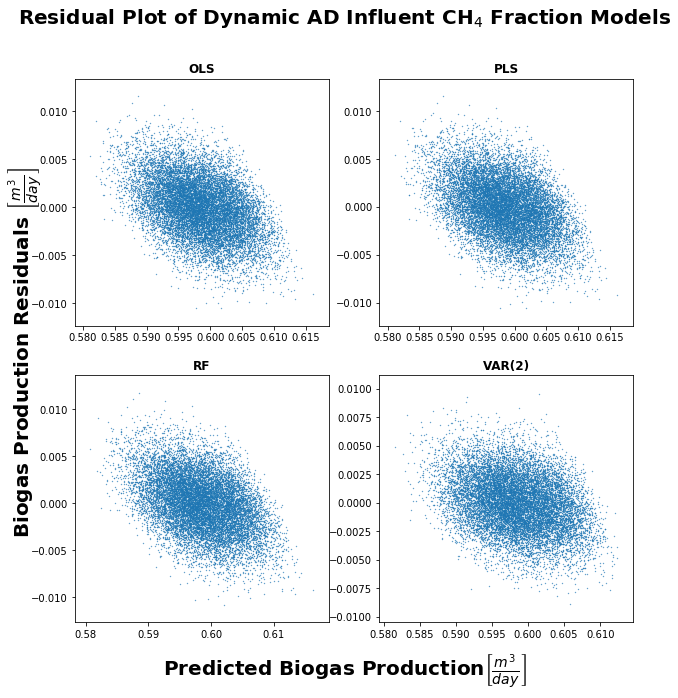

In [58]:
# Residual plot for dynamic AD influent CH4 fraction models
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic AD Influent CH$_4$ Fraction Models', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_In.OLS.CH4.rev_preds, Lag_regression_In.OLS.CH4.residuals, s = 0.1)
ax[1].scatter(Lag_regression_In.PLS.CH4.rev_preds, Lag_regression_In.PLS.CH4.residuals, s = 0.1)
ax[2].scatter(Lag_regression_In.RF.CH4.rev_preds, Lag_regression_In.RF.CH4.residuals, s = 0.1)
ax[3].scatter(In_VAR.CH4.rev_pred, In_VAR.CH4.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.text(0.031, 0.5,'Biogas Production Residuals '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Predicted Biogas Production'+ r'$ \left[\frac{m^3}{day} \right]$', ha = 'center', fontsize = 20, fontweight = 'bold')




Text(0.5, 0.05, 'Predicted Biogas Production$ \\left[\\frac{m^3}{day} \\right]$')

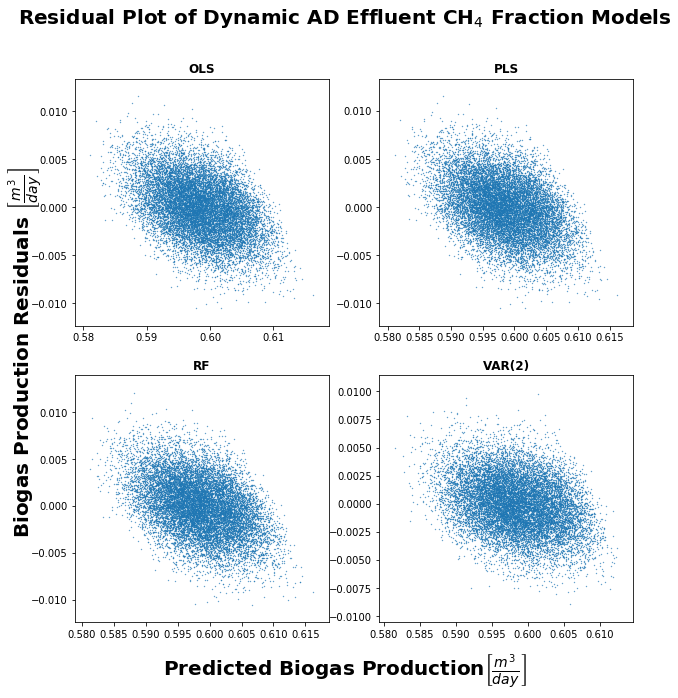

In [59]:
# Residual plot for dynamic AD Effluent CH4 fraction models
fig, ax = plt.subplots(2,2, figsize = (10,10))
ax = ax.flatten()

fig.suptitle(r'Residual Plot of Dynamic AD Effluent CH$_4$ Fraction Models', fontsize = 20, fontweight ='bold')
ax[0].scatter(Lag_regression_Out.OLS.CH4.rev_preds, Lag_regression_Out.OLS.CH4.residuals, s = 0.1)
ax[1].scatter(Lag_regression_Out.PLS.CH4.rev_preds, Lag_regression_Out.PLS.CH4.residuals, s = 0.1)
ax[2].scatter(Lag_regression_Out.RF.CH4.rev_preds, Lag_regression_Out.RF.CH4.residuals, s = 0.1)
ax[3].scatter(Out_VAR.CH4.rev_pred, Out_VAR.CH4.residuals, s = 0.1)

titles = ['OLS','PLS','RF','VAR(2)']

for i in range(4):
    ax[i].set_title(titles[i], fontweight = 'bold')


fig.text(0.031, 0.5,'Biogas Production Residuals '+ r'$ \left[\frac{m^3}{day} \right]$', va = 'center', fontsize = 20, rotation = 'vertical', fontweight = 'bold')
fig.text(0.5, 0.05,'Predicted Biogas Production'+ r'$ \left[\frac{m^3}{day} \right]$', ha = 'center', fontsize = 20, fontweight = 'bold')





Comparison of best biogas production model

In [222]:
OLS_lag_RMSE['Biogas']['Effluent']/Initial_OLS_RMSE['Biogas']['Effluent']

0.4595538796585714

In [214]:
Initial_OLS_RMSE['Biogas']['Effluent']

29.21226310713367

In [96]:
OLS_dif_RMSE['Biogas']['Effluent']/Initial_OLS_RMSE['Biogas']['Effluent']

0.4598943236747446

In [226]:
Out_VAR.biogas.RMSE/Initial_OLS_RMSE['Biogas']['Effluent']

0.3859649822941989

In [97]:
OLS_lag_RMSE['Biogas']['Effluent']/OLS_dif_RMSE['Biogas']['Effluent']

0.9992597342505711

In [98]:
np.mean(np.abs(Lag_regression_Out.OLS.biogas.residuals)/y_test['Biogas'])*100

0.40355053188829815

The mean average percentage error is 0.40 % for the effluent lagged OLS regression

In [253]:
np.mean(np.abs(In_VAR.biogas.residuals)/y_test['Biogas'])*100

0.33980521796947

The mean average percentage error is 0.40% for the effluent VAR model 

In [240]:
Initial_OLS_RMSE

,Biogas,$\mathbf{CH_{4}\%}$
Influent,140.316336,0.003121
Effluent,29.212263,0.003569


In [242]:
OLS_lag_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Effluent']/Initial_OLS_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Influent']

0.9513773016564913

In [243]:
OLS_lag_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Effluent']

0.0029692127224647635

In [231]:
Initial_OLS_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Influent']

0.003120962332499332

In [163]:
OLS_dif_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Effluent']/Initial_OLS_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Influent']

0.9512157302687873

In [166]:
In_VAR.CH4.RMSE/Initial_OLS_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Influent']

0.7758149381811467

In [167]:
Out_VAR.CH4.RMSE/Initial_OLS_RMSE[OLS_lag_RMSE.columns.tolist()[1]]['Influent']

0.7761370825312126

Comparison of best CH4 fraction model

In [100]:
np.mean(np.abs(Lag_regression_In.PLS.CH4.residuals)/y_test[y_test.columns.tolist()[1]])*100

0.39498849729595426

The mean average percentage error is around 1.19%, as a comparison the MAPE for the initial PLS model was 0.42%

In [252]:
np.mean(np.abs(Out_VAR.CH4.residuals)/y_test[y_test.columns.tolist()[1]])*100

0.32366362119389663

The mean average percentage error is around 38.88% which is absolutely dreadful.

In [102]:
Lag_regression_In.PLS.biogas.grid.best_estimator_['clf'].n_components

5

In [103]:
Lag_regression_Out.PLS.biogas.grid.best_estimator_['clf'].n_components

3

In [104]:
Lag_regression_In.PLS.CH4.grid.best_estimator_['clf'].n_components

1

In [105]:
Lag_regression_Out.PLS.CH4.grid.best_estimator_['clf'].n_components

1

PLS components for differenced regressions

In [106]:
Diff_regression_in.PLS.biogas.grid.best_estimator_['clf'].n_components

6

In [107]:
Diff_regression_out.PLS.biogas.grid.best_estimator_['clf'].n_components

1

In [108]:
Diff_regression_in.PLS.CH4.grid.best_estimator_['clf'].n_components

1

In [109]:
Diff_regression_out.PLS.CH4.grid.best_estimator_['clf'].n_components

1

In [85]:
dir(In_VAR.final)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slotnames__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_bmat_forc_cov',
 '_char_mat',
 '_chol_sigma_u',
 '_cov_alpha',
 '_cov_sigma',
 '_forecast_vars',
 '_model_type',
 '_omega_forc_cov',
 '_zz',
 'acf',
 'acorr',
 'aic',
 'bic',
 'bse',
 'coefs',
 'coefs_exog',
 'cov_params',
 'cov_ybar',
 'dates',
 'detomega',
 'df_model',
 'df_resid',
 'endog',
 'endog_lagged',
 'exog',
 'exog_names',
 'fevd',
 'fittedvalues',
 'forecast',
 'forecast_cov',
 'forecast_interval',
 'fpe',
 'get_eq_index',
 'hqic',
 'info_criteria',
 'intercept',
 'intercept_longrun',
 'irf',
 'irf_errband_mc',
 'irf_resim',
 'is_stable',
 'k_ar',
 'k_exog',
 'k_exog_user',
 'k_trend',
 'll

In [205]:
# to the anaerobic digester
Header_X_in_Res = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$', r'$\mathbf{CH_3COO^-}$','pH', 'Biogas', r'$\mathbf{CH_{4}}$ fraction']

# Variable names for the second biogas model that takes its input from the effluent
# of the anaerobic digester
Header_X_out_Res = ['Q', 'T', 'TSS', r'$\mathbf{NH_4}$', r'$\mathbf{PO^{3-}_4}$', r'$\mathbf{CO^{2-}_3}$','pH', 'VFAs', 'Biogas', r'$\mathbf{CH_{4}}$ fraction']

import plotly.io as pio
pio.renderers.default='notebook'

In [206]:
fig = ff.create_annotated_heatmap(np.round(In_VAR.final.resid_corr,2), x =Header_X_in_Res , y = Header_X_in_Res)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of the Correlation Matrix of Residuals for Influent VAR(2) Model}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Variable Name'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=12,
        color="#7f7f7f"
    )

fig.show()

In [207]:
fig = ff.create_annotated_heatmap(np.round(Out_VAR.final.resid_corr,2), x =Header_X_out_Res , y = Header_X_out_Res)
fig['data'][0]['showscale'] = True
fig['layout']['yaxis']['autorange'] = 'reversed'
fig['layout']['xaxis']['side'] = 'bottom'
fig['layout']['title'] = r'$\text{Heatmap of the Correlation Matrix of Residuals for Effluent VAR(2) Model}$'
fig.update_layout(title_x=0.5)
fig['layout']['xaxis_title'] = 'Variable Name'
fig['layout']['yaxis_title'] = 'Variable Name'
fig['layout']['font'] = dict(
        family="Droid Sans",
        size=12,
        color="#7f7f7f"
    )

fig.show()

In [152]:
dict_models = {'In': Diff_regression_in, 'Out': Diff_regression_out}
dict_rf_feature_importance = {'biogas':[], 'CH4':[]}

In [153]:
dict_rf_feature_importance = {'biogas':[], 'CH4':[]}

for attr, value in Diff_regression_in.RF.__dict__.items():
    dict_rf_feature_importance[attr] = Diff_regression_in.RF.biogas.clf.feature_importances_


In [154]:
for key in dict_models:
    for attr, value in dict_models[key].RF.__dict__.items():
        e = value.final.feature_importances_
        dict_rf_feature_importance[attr] = np.vstack((dict_rf_feature_importance[attr],e))
        
        
for key in dict_rf_feature_importance:
    dict_rf_feature_importance[key] = np.delete(dict_rf_feature_importance[key], (0), axis = 0)

In <__main__.NoCVMethod object at 0x1a65ca58d0> [0.12772297 0.12406636 0.12408594 0.12251434 0.12494085 0.12680746
 0.12427138 0.12559069]
In <__main__.NoCVMethod object at 0x1a65ca5e48> [0.12180863 0.12756557 0.12263252 0.12404957 0.12628059 0.12701222
 0.12421248 0.12643842]
Out <__main__.NoCVMethod object at 0x1a65ca47b8> [0.12815796 0.1225326  0.12477362 0.12565318 0.12509011 0.12378938
 0.12471065 0.12529252]
Out <__main__.NoCVMethod object at 0x1a65ca4320> [0.12437378 0.12541188 0.1254317  0.12670856 0.12396436 0.12403176
 0.12493166 0.1251463 ]


In [156]:
pd.DataFrame(dict_rf_feature_importance['biogas'])

,0,1,2,3,4,5,6,7
0,0.127723,0.124066,0.124086,0.122514,0.124941,0.126807,0.124271,0.125591
1,0.128158,0.122533,0.124774,0.125653,0.125090,0.123789,0.124711,0.125293


In [157]:
pd.DataFrame(dict_rf_feature_importance['CH4'])

,0,1,2,3,4,5,6,7
0,0.121809,0.127566,0.122633,0.124050,0.126281,0.127012,0.124212,0.126438
1,0.124374,0.125412,0.125432,0.126709,0.123964,0.124032,0.124932,0.125146


In [171]:
dir(Out_VAR.final)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slotnames__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_bmat_forc_cov',
 '_cache',
 '_char_mat',
 '_chol_sigma_u',
 '_cov_alpha',
 '_cov_sigma',
 '_forecast_vars',
 '_model_type',
 '_omega_forc_cov',
 '_zz',
 'acf',
 'acorr',
 'aic',
 'bic',
 'bse',
 'coefs',
 'coefs_exog',
 'cov_params',
 'cov_ybar',
 'dates',
 'detomega',
 'df_model',
 'df_resid',
 'endog',
 'endog_lagged',
 'exog',
 'exog_names',
 'fevd',
 'fittedvalues',
 'forecast',
 'forecast_cov',
 'forecast_interval',
 'fpe',
 'get_eq_index',
 'hqic',
 'info_criteria',
 'intercept',
 'intercept_longrun',
 'irf',
 'irf_errband_mc',
 'irf_resim',
 'is_stable',
 'k_ar',
 'k_exog',
 'k_exog_user',
 'k_t

In [257]:
Out_VAR.final.pvalues

,Q,T,TSS,$\mathbf{NH_4}$,$\mathbf{PO^{3-}_4}$,$\mathbf{CO^{2-}_3}$,pH,VFAs,Biogas,$\mathbf{CH_4}$
const,9.750254e-01,0.994931,0.959574,0.939492,0.957203,0.953967,0.998018,9.427570e-01,9.373611e-01,0.995484
L1.Q,0.000000e+00,0.147567,0.698687,0.303081,0.131325,0.026123,0.165155,2.117068e-11,6.853630e-08,0.116662
L1.T,5.767725e-01,0.000000,0.015956,0.839505,0.018826,0.022401,0.819472,5.168299e-01,5.773996e-01,0.220779
L1.TSS,1.513196e-01,0.732018,0.000000,0.345046,0.312993,0.747211,0.492254,1.839633e-04,9.172640e-01,0.812400
L1.$\mathbf{NH_4}$,9.073453e-01,0.015482,0.518424,0.000000,0.074492,0.621103,0.034823,6.569628e-01,6.019822e-02,0.350011
L1.$\mathbf{PO^{3-}_4}$,1.600428e-01,0.864328,0.600212,0.832589,0.000000,0.058406,0.920068,4.324109e-02,2.932571e-01,0.311529
L1.$\mathbf{CO^{2-}_3}$,1.614321e-02,0.601946,0.922403,0.553686,0.665733,0.000000,0.760150,2.330909e-04,2.335066e-05,0.566293
L1.pH,6.774812e-01,0.277582,0.919101,0.047052,0.444268,0.252127,0.000000,3.448788e-01,7.920158e-01,0.543599
L1.VFAs,9.934489e-07,0.491255,0.000007,0.023282,0.070731,0.095342,0.223088,0.000000e+00,1.167553e-57,0.420312
L1.Biogas,7.366538e-06,0.838536,0.023613,0.236358,0.016125,0.990060,0.142749,2.853194e-62,0.000000e+00,0.346533


In [210]:
pd.DataFrame(Out_VAR.final.acorr()[1])

,0,1,2,3,4,5,6,7,8,9
0,0.849882,0.001375,0.002945,0.001585,-0.002359,0.003102,0.002526,0.009679,-0.038489,0.003987
1,0.002160,-0.497882,-0.003024,0.011933,0.000048,-0.004400,-0.001448,-0.004964,-0.002393,-0.001875
2,0.002574,-0.005327,-0.495195,0.003127,0.002687,0.004120,0.000246,0.021416,0.005457,0.000386
3,-0.002623,-0.000424,-0.002231,-0.497254,-0.003565,0.005510,-0.009573,0.004349,-0.001884,-0.006895
4,-0.004607,0.004516,-0.001767,0.004040,-0.500007,-0.001517,-0.000912,0.005032,0.009010,-0.000356
5,-0.005910,0.002915,0.000728,0.002351,0.013491,-0.491823,0.007500,0.004904,-0.004213,-0.001200
6,0.004960,0.000980,-0.003644,0.005067,-0.002350,-0.004003,-0.501127,-0.008808,-0.003343,-0.003890
7,-0.006711,-0.002809,0.012317,-0.006593,0.006628,0.015010,0.000693,-0.455716,0.022906,-0.004528
8,-0.059105,-0.002598,-0.003128,0.007833,0.004317,0.011444,0.001519,0.018323,-0.466413,-0.004414
9,0.007416,0.004541,-0.000103,-0.006936,-0.003662,-0.000554,-0.002606,-0.001073,-0.003420,-0.502297


In [211]:
pd.DataFrame(In_VAR.final.acorr()[2])

,0,1,2,3,4,5,6,7,8,9
0,0.685270,-0.011276,-0.481520,0.170573,0.132439,0.234410,0.176266,-0.079122,-0.021421,0.003089
1,-0.010382,0.005669,0.010651,-0.005510,-0.001273,0.002546,-0.008726,-0.001722,0.000887,-0.001817
2,-0.548529,0.015070,0.668150,-0.051786,-0.094655,-0.259754,0.047917,0.085137,0.017153,-0.010854
3,-0.239269,0.007422,0.262251,0.724622,0.194014,-0.018057,0.465158,0.282500,0.033813,-0.006836
4,-0.155444,0.002032,0.164431,0.205969,0.713622,-0.003531,0.277785,-0.079569,0.022890,-0.005680
5,0.141269,-0.008721,-0.130961,0.110983,0.088677,0.083703,0.113989,-0.017524,0.012780,0.006139
6,-0.362804,0.008220,0.423603,0.429954,0.251364,-0.049653,0.751534,0.013935,0.050015,-0.010717
7,-0.081774,0.008003,0.071426,0.227190,-0.129841,-0.038795,-0.055290,0.207285,-0.004030,-0.005651
8,-0.061346,-0.007955,0.038063,0.013414,0.009765,-0.018060,0.017547,0.011370,0.004251,0.007886
9,0.012955,0.001289,-0.009784,-0.008400,-0.007607,-0.001352,-0.010875,0.000963,0.009453,0.011748


In [ ]:
IN